In [1]:
import pandas as pd

In [2]:
import numpy as np

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

## Union de Datos 2023 ley Cu_mb, Fe304_esc

In [2]:
# ley cobre de MB y ley Fe304 de escoria
escoria_FE_2023 = pd.read_excel("documentos/2023/Leyes.xlsx", skiprows=1, sheet_name = 'Ley Fe3O4_Escoria')

In [3]:
MB_Cu_2023 = pd.read_excel("documentos/2023/Leyes.xlsx", skiprows=2, sheet_name = 'Ley Cu_MB')

In [4]:
#archivo Datos 1 hoja Average
df_total = pd.read_excel("documentos/2023/Datos 1..xlsx", skiprows=1, sheet_name = 'Average.')

In [5]:
df_total.drop('Unnamed: 0', axis=1, inplace=True)
MB_Cu_2023.drop('Unnamed: 0', axis=1, inplace=True)
escoria_FE_2023.drop('Unnamed: 0', axis=1, inplace=True)

In [6]:
escoria_FE_2023

,Fecha,Equipo,Producto,Hora,Valor
0,2023-01-01,CT,ESCOR,00:20:00,21.100000
1,2023-01-01,CT,ESCOR,12:10:00,21.600000
2,2023-01-01,CT,ESCOR,14:20:00,20.700001
3,2023-01-01,CT,ESCOR,15:50:00,16.900000
4,2023-01-01,CT,ESCOR,17:50:00,14.500000
...,...,...,...,...,...
1087,2023-06-10,CT,ESCOR,22:10:00,10.500000
1088,2023-06-11,CT,ESCOR,00:10:00,14.100000
1089,2023-06-11,CT,ESCOR,15:20:00,13.800000
1090,2023-06-11,CT,ESCOR,16:40:00,13.800000


In [7]:
escoria_FE_2023['Fecha'] = escoria_FE_2023['Fecha'].astype(str)
MB_Cu_2023['Fecha'] = MB_Cu_2023['Fecha'].astype(str)

In [8]:
escoria_FE_2023['Timestamp'] = escoria_FE_2023['Fecha'].astype(str)+' '+escoria_FE_2023['Hora'].astype(str)
MB_Cu_2023['Timestamp'] = MB_Cu_2023['Fecha'].astype(str)+' '+MB_Cu_2023['Hora'].astype(str)

In [9]:
df_total

,TimeStamp,.FI_325,.[FFIC_324.PV],.TASA_INST,.[WIC_135.PV],.[WIC_134.PV],.TIR_311,.TIR_313
0,2023-01-01 00:04:59,497.82298,37.975855,67.040951,4.868728,2.272423,1239.551086,1242.537354
1,2023-01-01 00:09:59,490.657786,38.31309,48.213518,6.274582,3.707383,1239.545825,1242.556079
2,2023-01-01 00:14:59,411.457943,27.15304,61.80843,4.291978,2.740755,1239.564771,1242.520361
3,2023-01-01 00:19:59,0,21,0,0.00222,0.003208,1239.557458,1242.529431
4,2023-01-01 00:24:59,0,21,0,0.002117,0.003212,1239.556494,1242.52572
...,...,...,...,...,...,...,...,...
51841,2023-06-30 23:34:59,0,21,0,0,0,0.000092,0.000092
51842,2023-06-30 23:39:59,0,21,0,0,0,0.000092,0.000092
51843,2023-06-30 23:44:59,0,21,0,0,0,0.000092,0.000092
51844,2023-06-30 23:49:59,0,21,0,0,0,0.000092,0.000092


In [10]:
MB_Cu_2023

,Fecha,Equipo,Producto,Hora,Valor,Timestamp
0,2023-01-01,CT,METAL,14:00:00,63.980000,2023-01-01 14:00:00
1,2023-01-01,CT,METAL,17:10:00,63.580002,2023-01-01 17:10:00
2,2023-01-01,CT,METAL,19:30:00,66.779999,2023-01-01 19:30:00
3,2023-01-01,CT,METAL,21:00:00,67.870003,2023-01-01 21:00:00
4,2023-01-01,CT,METAL,22:50:00,67.900002,2023-01-01 22:50:00
...,...,...,...,...,...,...
858,2023-06-09,CT,METAL,17:50:00,72.080002,2023-06-09 17:50:00
859,2023-06-09,CT,METAL,19:20:00,72.750000,2023-06-09 19:20:00
860,2023-06-10,CT,METAL,21:10:00,69.769997,2023-06-10 21:10:00
861,2023-06-10,CT,METAL,23:20:00,67.580002,2023-06-10 23:20:00


In [11]:
escoria_FE_2023['Timestamp'] = pd.to_datetime(escoria_FE_2023['Timestamp'])
MB_Cu_2023['Timestamp'] = pd.to_datetime(MB_Cu_2023['Timestamp'])

In [29]:
from datetime import timedelta

In [13]:
escoria_FE_2023['Timestamp'] = escoria_FE_2023['Timestamp'].dt.strftime("%Y-%m-%d %H:%m:%s")
MB_Cu_2023['Timestamp'] = MB_Cu_2023['Timestamp'].dt.strftime("%Y-%m-%d %H:%m:%s")

In [14]:
escoria_FE_2023['Timestamp'] = pd.to_datetime(escoria_FE_2023['Timestamp'])
MB_Cu_2023['Timestamp'] = pd.to_datetime(MB_Cu_2023['Timestamp'])

In [15]:
escoria_FE_2023.drop(['Fecha', 'Equipo', 'Producto', 'Hora'], axis=1, inplace=True)
MB_Cu_2023.drop(['Fecha', 'Equipo', 'Producto', 'Hora'], axis=1, inplace=True)

In [16]:
escoria_FE_2023.rename(columns={'Valor':'escoria_FE'}, inplace=True)
MB_Cu_2023.rename(columns={'Valor':'MB_Cu'}, inplace=True)

In [17]:
MB_Cu_2023

,MB_Cu,Timestamp
0,63.980000,2023-01-01 14:00:00
1,63.580002,2023-01-01 17:10:00
2,66.779999,2023-01-01 19:30:00
3,67.870003,2023-01-01 21:00:00
4,67.900002,2023-01-01 22:50:00
...,...,...
858,72.080002,2023-06-09 17:50:00
859,72.750000,2023-06-09 19:20:00
860,69.769997,2023-06-10 21:10:00
861,67.580002,2023-06-10 23:20:00


In [18]:
df_total['TimeStamp'] = df_total['TimeStamp'] + timedelta(seconds=1)

In [19]:
escoria_FE_2023

,escoria_FE,Timestamp
0,21.100000,2023-01-01 00:20:00
1,21.600000,2023-01-01 12:10:00
2,20.700001,2023-01-01 14:20:00
3,16.900000,2023-01-01 15:50:00
4,14.500000,2023-01-01 17:50:00
...,...,...
1087,10.500000,2023-06-10 22:10:00
1088,14.100000,2023-06-11 00:10:00
1089,13.800000,2023-06-11 15:20:00
1090,13.800000,2023-06-11 16:40:00


In [20]:
escoria_FE_2023['Timestamp']

0      2023-01-01 00:20:00
1      2023-01-01 12:10:00
2      2023-01-01 14:20:00
3      2023-01-01 15:50:00
4      2023-01-01 17:50:00
               ...        
1087   2023-06-10 22:10:00
1088   2023-06-11 00:10:00
1089   2023-06-11 15:20:00
1090   2023-06-11 16:40:00
1091   2023-06-11 17:30:00
Name: Timestamp, Length: 1092, dtype: datetime64[ns]

In [21]:
df_total.rename(columns={'TimeStamp':'Timestamp'}, inplace=True)

In [22]:
escoria_FE_2023[~escoria_FE_2023['Timestamp'].isin(df_total['Timestamp'])] #no existe el 31-01-2021 en los datos average

,escoria_FE,Timestamp
215,20.100000,2023-01-31 01:30:00
216,19.799999,2023-01-31 03:10:00
217,21.900000,2023-01-31 05:00:00
218,22.700001,2023-01-31 13:40:00
219,13.700000,2023-01-31 15:40:00
220,19.100000,2023-01-31 17:20:00
221,16.299999,2023-01-31 18:50:00
222,15.700000,2023-01-31 20:20:00
223,18.799999,2023-01-31 21:40:00
224,19.400000,2023-01-31 23:20:00


In [23]:
merge = pd.merge(df_total,escoria_FE_2023, how='left', on = 'Timestamp')

In [24]:
merge = pd.merge(merge,MB_Cu_2023, how='left', on = 'Timestamp')

In [ ]:
merge

In [27]:
merge['escoria_FE'] = merge['escoria_FE'].fillna(method='backfill')

In [28]:
merge['MB_Cu'] = merge['MB_Cu'].fillna(method='backfill')

In [ ]:
merge

In [31]:
merge['escoria_FE'] = merge['escoria_FE'].fillna(method='ffill')

In [32]:
merge['MB_Cu'] = merge['MB_Cu'].fillna(method='ffill')

In [33]:
merge

,Timestamp,.FI_325,.[FFIC_324.PV],.TASA_INST,.[WIC_135.PV],.[WIC_134.PV],.TIR_311,.TIR_313,escoria_FE,MB_Cu
0,2023-01-01 00:05:00,497.82298,37.975855,67.040951,4.868728,2.272423,1239.551086,1242.537354,21.1,63.980000
1,2023-01-01 00:10:00,490.657786,38.31309,48.213518,6.274582,3.707383,1239.545825,1242.556079,21.1,63.980000
2,2023-01-01 00:15:00,411.457943,27.15304,61.80843,4.291978,2.740755,1239.564771,1242.520361,21.1,63.980000
3,2023-01-01 00:20:00,0,21,0,0.00222,0.003208,1239.557458,1242.529431,21.1,63.980000
4,2023-01-01 00:25:00,0,21,0,0.002117,0.003212,1239.556494,1242.52572,21.6,63.980000
...,...,...,...,...,...,...,...,...,...,...
51841,2023-06-30 23:35:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001
51842,2023-06-30 23:40:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001
51843,2023-06-30 23:45:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001
51844,2023-06-30 23:50:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001


### union ley con_cu y con_S

In [34]:
Con_cu = pd.read_excel("documentos/2023/Leyes.xlsx", skiprows=2, sheet_name = 'Ley Cu_Concentrado.')

In [35]:
Con_S = pd.read_excel("documentos/2023/Leyes.xlsx", skiprows=2, sheet_name = 'Ley S_Concentrado.')

In [36]:
Con_S.drop('Unnamed: 0', axis=1, inplace=True)
Con_cu.drop('Unnamed: 0', axis=1, inplace=True)

In [37]:
Con_cu.rename(columns={'Día':'Con_cu'}, inplace=True)
Con_S.rename(columns={'Día':'Con_S'}, inplace=True)

In [38]:
Con_S

,Fecha,Nombre,Con_S
0,2023-01-01,Ley S.,32.000000
1,2023-01-02,Ley S.,31.299999
2,2023-01-03,Ley S.,32.400002
3,2023-01-04,Ley S.,31.100000
4,2023-01-05,Ley S.,31.299999
...,...,...,...
176,2023-06-26,Ley S.,0.000000
177,2023-06-27,Ley S.,0.000000
178,2023-06-28,Ley S.,0.000000
179,2023-06-29,Ley S.,0.000000


In [39]:
merge['Fecha'] = merge['Timestamp'].dt.strftime("%Y-%m-%d")

In [40]:
merge['Fecha'] = pd.to_datetime(merge['Fecha'])

In [41]:
merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51846 entries, 0 to 51845
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Timestamp       51846 non-null  datetime64[ns]
 1   .FI_325         51846 non-null  object        
 2   .[FFIC_324.PV]  51846 non-null  object        
 3   .TASA_INST      51846 non-null  object        
 4   .[WIC_135.PV]   51846 non-null  object        
 5   .[WIC_134.PV]   51846 non-null  object        
 6   .TIR_311        51846 non-null  object        
 7   .TIR_313        51846 non-null  object        
 8   escoria_FE      51846 non-null  float64       
 9   MB_Cu           51846 non-null  float64       
 10  Fecha           51846 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(2), object(7)
memory usage: 4.4+ MB


In [42]:
Con_S.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181 entries, 0 to 180
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Fecha   181 non-null    datetime64[ns]
 1   Nombre  181 non-null    object        
 2   Con_S   181 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 4.4+ KB


In [43]:
merge = pd.merge(merge,Con_S, how='left', on = 'Fecha')

In [44]:
merge = pd.merge(merge,Con_cu, how='left', on = 'Fecha')

In [45]:
merge.drop(['Nombre_x', 'Nombre_y'], axis=1, inplace=True)

In [46]:
merge

,Timestamp,.FI_325,.[FFIC_324.PV],.TASA_INST,.[WIC_135.PV],.[WIC_134.PV],.TIR_311,.TIR_313,escoria_FE,MB_Cu,Fecha,Con_S,Con_cu
0,2023-01-01 00:05:00,497.82298,37.975855,67.040951,4.868728,2.272423,1239.551086,1242.537354,21.1,63.980000,2023-01-01,32.0,22.5
1,2023-01-01 00:10:00,490.657786,38.31309,48.213518,6.274582,3.707383,1239.545825,1242.556079,21.1,63.980000,2023-01-01,32.0,22.5
2,2023-01-01 00:15:00,411.457943,27.15304,61.80843,4.291978,2.740755,1239.564771,1242.520361,21.1,63.980000,2023-01-01,32.0,22.5
3,2023-01-01 00:20:00,0,21,0,0.00222,0.003208,1239.557458,1242.529431,21.1,63.980000,2023-01-01,32.0,22.5
4,2023-01-01 00:25:00,0,21,0,0.002117,0.003212,1239.556494,1242.52572,21.6,63.980000,2023-01-01,32.0,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51841,2023-06-30 23:35:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0
51842,2023-06-30 23:40:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0
51843,2023-06-30 23:45:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0
51844,2023-06-30 23:50:00,0,21,0,0,0,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0


In [71]:
merge.rename(columns={'.FI_325':'Flujo_aire', '.[FFIC_324.PV]':'Enr_oxigeno', '.TASA_INST':'Alimentacion_con', 
                        '.[WIC_135.PV]':'Alimentacion_Si02','.[WIC_134.PV]':'carga_fria', '.TIR_311':'t°_MB',
                         '.TIR_313':'t°_esc'}, inplace = True)

In [72]:
merge

,Timestamp,Flujo_aire,Enr_oxigeno,Alimentacion_con,Alimentacion_Si02,carga_fria,t°_MB,t°_esc,escoria_FE,MB_Cu,Fecha,Con_S,Con_cu
0,2023-01-01 00:05:00,497.822980,37.975855,67.040951,4.868728,2.272423,1239.551086,1242.537354,21.1,63.980000,2023-01-01,32.0,22.5
1,2023-01-01 00:10:00,490.657786,38.313090,48.213518,6.274582,3.707383,1239.545825,1242.556079,21.1,63.980000,2023-01-01,32.0,22.5
2,2023-01-01 00:15:00,411.457943,27.153040,61.808430,4.291978,2.740755,1239.564771,1242.520361,21.1,63.980000,2023-01-01,32.0,22.5
3,2023-01-01 00:20:00,0.000000,21.000000,0.000000,0.002220,0.003208,1239.557458,1242.529431,21.1,63.980000,2023-01-01,32.0,22.5
4,2023-01-01 00:25:00,0.000000,21.000000,0.000000,0.002117,0.003212,1239.556494,1242.525720,21.6,63.980000,2023-01-01,32.0,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51841,2023-06-30 23:35:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0
51842,2023-06-30 23:40:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0
51843,2023-06-30 23:45:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0
51844,2023-06-30 23:50:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,17.1,68.720001,2023-06-30,0.0,0.0


In [73]:
merge.to_csv('documentos/completos/df_2023.csv')

In [49]:
merge['.TIR_311']

0        1239.551086
1        1239.545825
2        1239.564771
3        1239.557458
4        1239.556494
            ...     
51841       0.000092
51842       0.000092
51843       0.000092
51844       0.000092
51845       0.000092
Name: .TIR_311, Length: 51846, dtype: object

In [51]:
import numpy as np
import matplotlib.pyplot as plt

In [56]:
merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51846 entries, 0 to 51845
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Timestamp       51846 non-null  datetime64[ns]
 1   .FI_325         51846 non-null  object        
 2   .[FFIC_324.PV]  51846 non-null  object        
 3   .TASA_INST      51846 non-null  object        
 4   .[WIC_135.PV]   51846 non-null  object        
 5   .[WIC_134.PV]   51846 non-null  object        
 6   .TIR_311        51846 non-null  object        
 7   .TIR_313        51846 non-null  object        
 8   escoria_FE      51846 non-null  float64       
 9   MB_Cu           51846 non-null  float64       
 10  Fecha           51846 non-null  datetime64[ns]
 11  Con_S           51846 non-null  float64       
 12  Con_cu          51846 non-null  float64       
dtypes: datetime64[ns](2), float64(4), object(7)
memory usage: 5.1+ MB


In [64]:
merge.replace('Null', np.nan, inplace = True)

In [67]:
merge[merge['.TIR_311'].isnull()].shape

(2439, 13)

{'whiskers': [<matplotlib.lines.Line2D at 0x1e7fc8a8c50>,
 'caps': [<matplotlib.lines.Line2D at 0x1e7fae70b10>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e7fae55890>],
 'medians': [<matplotlib.lines.Line2D at 0x1e7f9daac50>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e7fae6a310>],
 'means': []}

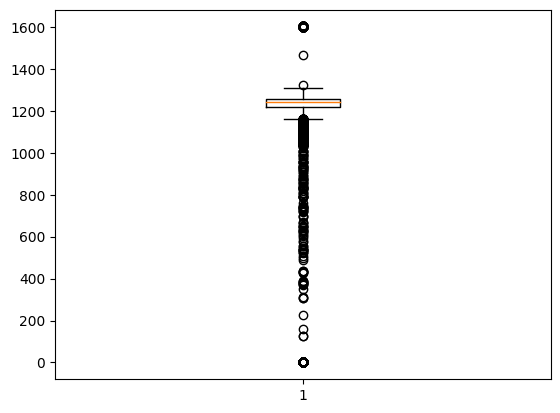

In [66]:
fig, ax = plt.subplots()
ax.boxplot(merge['.TIR_311'].dropna().astype(float))

{'whiskers': [<matplotlib.lines.Line2D at 0x1e7fca5b850>,
 'caps': [<matplotlib.lines.Line2D at 0x1e7fca68b50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e7fc9e5550>],
 'medians': [<matplotlib.lines.Line2D at 0x1e7fca69cd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e7fca6a510>],
 'means': []}

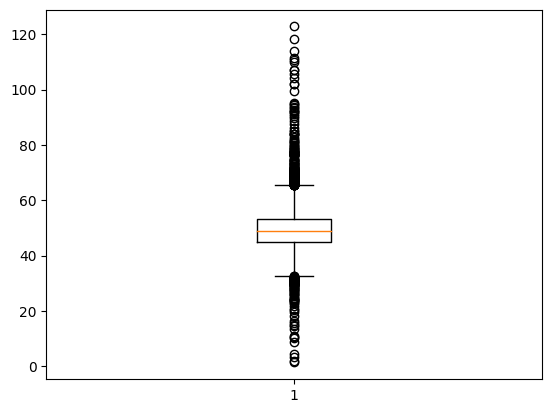

In [70]:
fig, ax = plt.subplots()
ax.boxplot(merge[merge['.TASA_INST']>0]['.TASA_INST'].dropna().astype(float))

<Axes: >

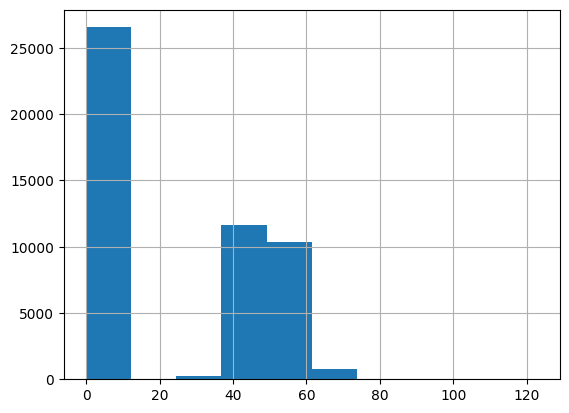

In [69]:
merge['.TASA_INST'].hist()

## union data 2021 a 2023

In [5]:
df_2021_2023 = pd.read_csv('documentos/completos/df_total.csv', sep=';')

In [9]:
df_2021_2023.fillna(0, inplace=True)

In [10]:
df_2021_2023

,TimeStamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,escoria_FE304,mb_cu
0,01-07-2021 0:04,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
1,01-07-2021 0:09,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
2,01-07-2021 0:14,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
3,01-07-2021 0:19,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
4,01-07-2021 0:24,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,20-06-2023 13:39,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0
206323,20-06-2023 13:44,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0
206324,20-06-2023 13:49,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0
206325,20-06-2023 13:54,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0


In [11]:
MB_Cu_2021_22 = pd.read_excel("documentos/Leyes 2021-2022..xlsx", sheet_name = 'Ley Cu_MB')

In [13]:
escoria_fe_2022 = pd.read_excel("documentos/Leyes 2021-2022..xlsx", sheet_name = 'Ley Fe3O4_Escoria')
escoria_fe_2021 = pd.read_excel("documentos/Fe3O4_2021.xlsx")

In [14]:
# ley cobre de MB y ley Fe304 de escoria 2023
escoria_FE_2023 = pd.read_excel("documentos/2023/Leyes.xlsx", skiprows=1, sheet_name = 'Ley Fe3O4_Escoria')
MB_Cu_2023 = pd.read_excel("documentos/2023/Leyes.xlsx", skiprows=2, sheet_name = 'Ley Cu_MB')

In [ ]:
### unir cu mb 2021-2023

In [20]:
MB_Cu_2023.drop(['Unnamed: 0', 'Equipo', 'Producto'], axis=1, inplace=True)
MB_Cu_2021_22.drop('Ensaye', axis=1, inplace=True)

In [27]:
MB_Cu_2021_22.dropna(inplace=True)

In [30]:
MB_Cu_2021_22

,Fecha,Hora,Valor
0,2021-07-26,19:40:00,74.309998
1,2021-07-26,20:50:00,38.970001
2,2021-07-26,22:20:00,74.370003
3,2021-07-27,00:10:00,77.680000
4,2021-07-27,17:20:00,79.110001
...,...,...,...
3967,2022-12-30,23:20:00,70.430000
3968,2022-12-31,16:50:00,69.120003
3969,2022-12-31,19:10:00,70.680000
3970,2022-12-31,21:40:00,71.290001


In [29]:
MB_Cu_2023

,Fecha,Hora,Valor
0,2023-01-01,14:00:00,63.980000
1,2023-01-01,17:10:00,63.580002
2,2023-01-01,19:30:00,66.779999
3,2023-01-01,21:00:00,67.870003
4,2023-01-01,22:50:00,67.900002
...,...,...,...
858,2023-06-09,17:50:00,72.080002
859,2023-06-09,19:20:00,72.750000
860,2023-06-10,21:10:00,69.769997
861,2023-06-10,23:20:00,67.580002


In [32]:
MB_Cu = pd.concat([MB_Cu_2021_22, MB_Cu_2023])

In [33]:
MB_Cu

,Fecha,Hora,Valor
0,2021-07-26,19:40:00,74.309998
1,2021-07-26,20:50:00,38.970001
2,2021-07-26,22:20:00,74.370003
3,2021-07-27,00:10:00,77.680000
4,2021-07-27,17:20:00,79.110001
...,...,...,...
858,2023-06-09,17:50:00,72.080002
859,2023-06-09,19:20:00,72.750000
860,2023-06-10,21:10:00,69.769997
861,2023-06-10,23:20:00,67.580002


In [ ]:
### unir fe302 esc 2021-2023

In [ ]:
escoria_fe_2021
escoria_fe_2022
escoria_FE_2023

In [40]:
escoria_fe_2021.drop('Ensaye', axis=1, inplace=True)
escoria_fe_2022.drop('Ensaye', axis=1, inplace=True)
escoria_FE_2023.drop(['Unnamed: 0', 'Equipo', 'Producto'], axis=1, inplace=True)

In [46]:
escoria_fe_2021.dropna(inplace=True)

In [52]:
ESC_FE302 = pd.concat([escoria_fe_2021, escoria_fe_2022])

In [54]:
ESC_FE302 = pd.concat([ESC_FE302, escoria_FE_2023])

In [55]:
ESC_FE302

,Fecha,Hora,Valor
0,2021-06-01,13:20:00,14.590000
1,2021-06-01,16:30:00,12.900000
2,2021-06-02,11:40:00,12.900000
3,2021-06-02,13:30:00,19.799999
4,2021-06-03,10:50:00,12.700000
...,...,...,...
1087,2023-06-10,22:10:00,10.500000
1088,2023-06-11,00:10:00,14.100000
1089,2023-06-11,15:20:00,13.800000
1090,2023-06-11,16:40:00,13.800000


In [ ]:
#unir a todo

In [ ]:
MB_Cu
ESC_FE302
df_2021_2023

In [60]:
MB_Cu['Timestamp'] = MB_Cu['Fecha'].astype(str)+' '+MB_Cu['Hora'].astype(str)
ESC_FE302['Timestamp'] = ESC_FE302['Fecha'].astype(str)+' '+ESC_FE302['Hora'].astype(str)

In [84]:
MB_Cu['Timestamp'] = pd.to_datetime(MB_Cu['Timestamp'])
ESC_FE302['Timestamp'] = pd.to_datetime(ESC_FE302['Timestamp'])

In [88]:
ESC_FE302.rename(columns={'Valor':'ESC_FE'}, inplace=True)
MB_Cu.rename(columns={'Valor':'MB_Cu'}, inplace=True)

In [90]:
ESC_FE302.drop(['Fecha', 'Hora'], axis=1, inplace=True)
MB_Cu.drop(['Fecha', 'Hora'], axis=1, inplace=True)

In [92]:
MB_Cu

,MB_Cu,Timestamp
0,74.309998,2021-07-26 19:40:00
1,38.970001,2021-07-26 20:50:00
2,74.370003,2021-07-26 22:20:00
3,77.680000,2021-07-27 00:10:00
4,79.110001,2021-07-27 17:20:00
...,...,...
858,72.080002,2023-06-09 17:50:00
859,72.750000,2023-06-09 19:20:00
860,69.769997,2023-06-10 21:10:00
861,67.580002,2023-06-10 23:20:00


In [66]:
from datetime import timedelta

In [75]:
df_2021_2023['TimeStamp'] = pd.to_datetime(df_2021_2023['TimeStamp'], dayfirst=True)

In [78]:
df_2021_2023['TimeStamp'] = df_2021_2023['TimeStamp'] + timedelta(minutes=1)

In [94]:
df_2021_2023.rename(columns={'TimeStamp':'Timestamp'}, inplace=True)

In [95]:
df_2021_2023.head()

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,escoria_FE304,mb_cu
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.0,0.0,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.0,0.0,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.0,0.0,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.0,0.0,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.0,0.0,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0


In [97]:
MB_Cu[~MB_Cu['Timestamp'].isin(df_2021_2023['Timestamp'])] #31-08-2021 y 31-01-2023 no existen

,MB_Cu,Timestamp
334,73.669998,2021-08-31 03:20:00
335,73.059998,2021-08-31 07:00:00
336,76.150002,2021-08-31 14:20:00
337,77.809998,2021-08-31 18:40:00
338,78.919998,2021-08-31 21:10:00
339,75.139999,2021-08-31 22:40:00
340,73.230003,2021-08-31 23:20:00
3473,71.959999,2022-09-11 01:00:00
170,65.599998,2023-01-31 02:00:00
171,67.599998,2023-01-31 04:30:00


In [98]:
ESC_FE302[~ESC_FE302['Timestamp'].isin(df_2021_2023['Timestamp'])]

,ESC_FE,Timestamp
0,14.590000,2021-06-01 13:20:00
1,12.900000,2021-06-01 16:30:00
2,12.900000,2021-06-02 11:40:00
3,19.799999,2021-06-02 13:30:00
4,12.700000,2021-06-03 10:50:00
5,6.500000,2021-06-03 12:30:00
6,6.700000,2021-06-03 14:50:00
7,15.500000,2021-06-04 18:20:00
8,12.600000,2021-06-04 21:10:00
9,15.100000,2021-06-05 15:40:00


In [110]:
Merge = pd.merge(df_2021_2023,MB_Cu, how='left', on = 'Timestamp')

In [111]:
Merge = pd.merge(Merge,ESC_FE302, how='left', on = 'Timestamp')

In [113]:
Merge

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,escoria_FE304,mb_cu,MB_Cu,ESC_FE
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0,NaN,NaN
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0,NaN,NaN
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0,NaN,NaN
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0,NaN,NaN
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0,NaN,NaN
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0,NaN,NaN
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0,NaN,NaN
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,0.0,0.0,NaN,NaN


In [114]:
Merge['ESC_FE'] = Merge['ESC_FE'].fillna(method='backfill')
Merge['MB_Cu'] = Merge['MB_Cu'].fillna(method='backfill')

In [115]:
Merge['ESC_FE'] = Merge['ESC_FE'].fillna(method='ffill')
Merge['MB_Cu'] = Merge['MB_Cu'].fillna(method='ffill')

In [121]:
Merge.drop(['mb_cu', 'escoria_FE304'], axis=1, inplace= True)

In [122]:
Merge

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000


In [123]:
Merge.to_csv('documentos/completos/actualizado/df_21_23.csv')

In [126]:
#analisis

In [161]:
Merge = pd.read_csv('documentos/completos/actualizado/df_21_23.csv')

In [162]:
Merge

,Unnamed: 0,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE
0,0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
1,1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
2,2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
3,3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
4,4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206323,206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206324,206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206325,206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000


<Axes: >

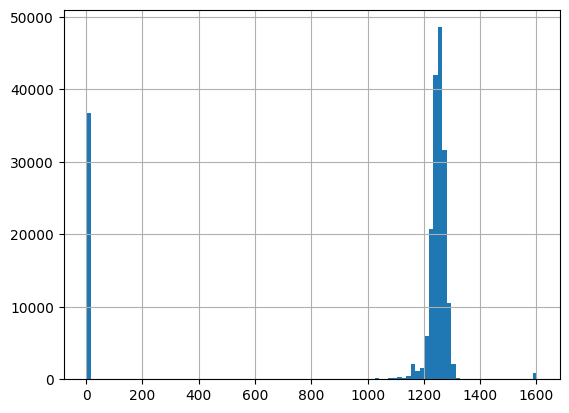

In [163]:
Merge['t MB'].hist(bins=100)

In [166]:
Merge.loc[Merge[((Merge['t MB']>1400) | (Merge['t MB']<1200)) & (Merge['t MB']>100)].index, 't MB'] = np.nan

In [167]:
Merge[((Merge['t MB']>1400) | (Merge['t MB']<1200)) & (Merge['t MB']>100)]

,Unnamed: 0,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE


In [168]:
Merge[Merge['t MB'].isnull()]

,Unnamed: 0,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE
8021,8021,2021-07-28 20:30:00,376.875145,41.792655,57.326190,0.002373,3.031430,NaN,1248.814319,28-07-2021,29.200001,24.000000,68.970001,19.500000
8326,8326,2021-07-29 21:55:00,409.298704,37.238818,55.762500,4.475399,0.003149,NaN,1229.002856,29-07-2021,29.100000,23.900000,69.250000,21.799999
8345,8345,2021-07-29 23:30:00,452.296859,38.123520,59.597434,4.507606,0.003148,NaN,1215.983484,29-07-2021,29.100000,23.900000,55.919998,17.799999
8417,8417,2021-07-30 05:30:00,371.725990,38.089096,52.745228,5.522462,0.002634,NaN,1254.647852,30-07-2021,29.400000,24.400000,53.250000,15.900000
8418,8418,2021-07-30 05:35:00,381.142593,37.947592,49.202247,5.472450,0.002819,NaN,1254.654028,30-07-2021,29.400000,24.400000,53.250000,15.900000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203225,203225,2023-06-09 19:35:00,393.825497,41.046641,31.893222,5.266244,0.003436,NaN,1236.408618,09-06-2023,34.299999,24.400000,69.769997,15.100000
203533,203533,2023-06-10 21:15:00,397.583399,38.314680,52.663392,5.987306,0.003091,NaN,1213.054175,10-06-2023,0.000000,0.000000,67.580002,10.500000
203563,203563,2023-06-10 23:45:00,416.782821,39.890054,36.299807,4.525943,0.003335,NaN,1234.058997,10-06-2023,0.000000,0.000000,68.720001,14.100000
203748,203748,2023-06-11 15:10:00,367.657095,42.880502,49.511251,5.041599,0.003061,NaN,1301.083374,11-06-2023,35.599998,25.200001,68.720001,13.800000


In [169]:
Merge['t MB'] = Merge['t MB'].fillna(method='backfill')

In [170]:
Merge[Merge['t MB'].isnull()]

,Unnamed: 0,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE


In [174]:
Merge.loc[Merge[((Merge['t ESC']>1400) | (Merge['t ESC']<1200)) & (Merge['t ESC']>100)].index, 't ESC'] = np.nan

In [175]:
Merge['t ESC'] = Merge['t ESC'].fillna(method='backfill')

In [176]:
Merge[Merge['t ESC'].isnull()]

,Unnamed: 0,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE


In [177]:
Merge

,Unnamed: 0,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE
0,0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
1,1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
2,2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
3,3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
4,4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206323,206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206324,206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206325,206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000


<Axes: >

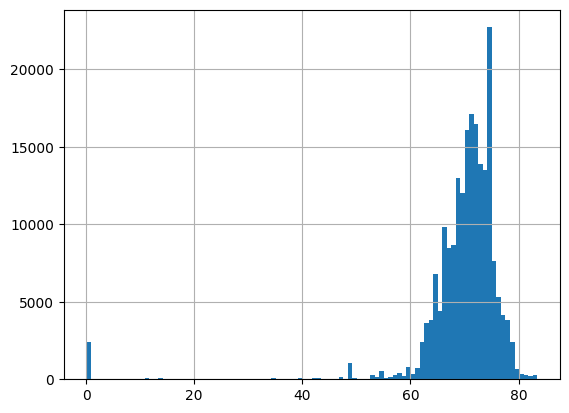

In [188]:
Merge['MB_Cu'].hist(bins=100)

<Axes: >

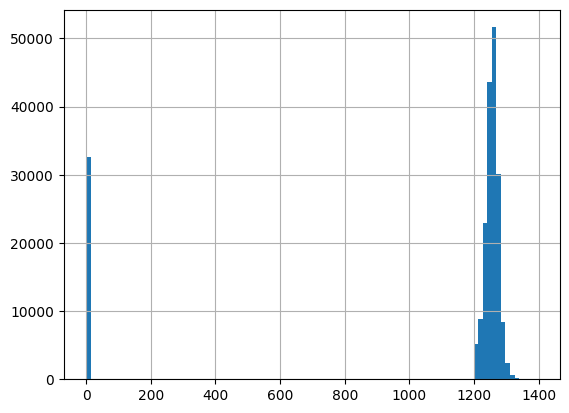

In [185]:
Merge['t ESC'].hist(bins=100)

In [245]:
Merge['O2_proporcion'] = (Merge['Flujo aire'] * Merge['enriquecimiento oxigeno'])/100

In [246]:
Merge

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0


<Axes: >

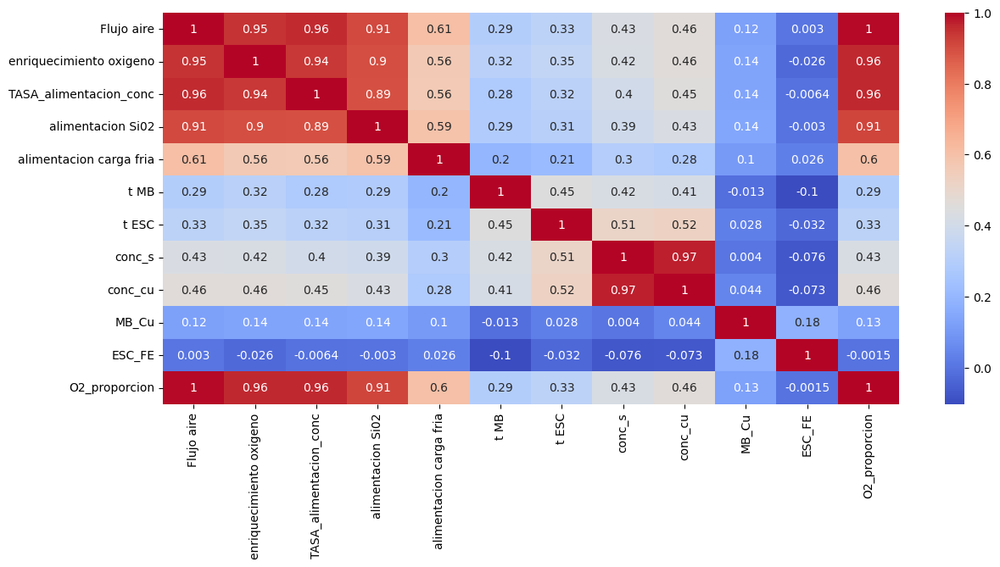

In [198]:
plt.figure(figsize=(14,6))
sns.heatmap(Merge.drop(['Unnamed: 0', 'Timestamp', 'TimeStamp_2'], axis=1).corr(),cmap='coolwarm',annot=True)

<Axes: >

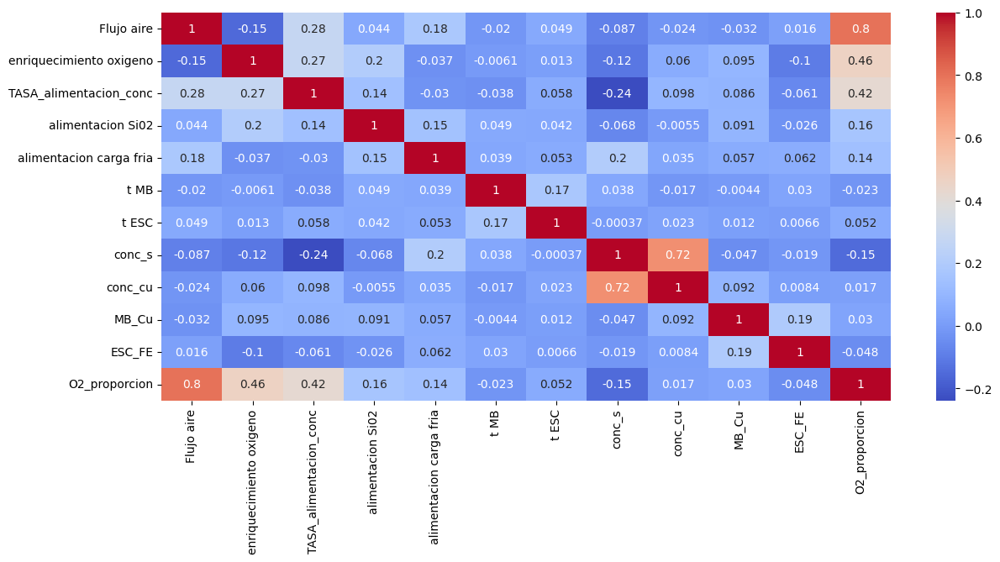

In [199]:
plt.figure(figsize=(14,6))
sns.heatmap(Merge[Merge['TASA_alimentacion_conc']>0].drop(['Unnamed: 0', 'Timestamp', 'TimeStamp_2'], axis=1).corr(),cmap='coolwarm',annot=True)

In [201]:
Merge.drop('Unnamed: 0', axis=1, inplace=True)

In [202]:
Merge

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0


### agregar columna periodo de trabajo

In [ ]:
Merge

In [204]:
Merge['proceso'] = 0
i = 1
estado = 0
for indice, columna in Merge.iterrows():
    if columna['TASA_alimentacion_conc'] != 0 and estado == 0:
        Merge.loc[indice, 'proceso'] = i
        estado = columna['TASA_alimentacion_conc']
    if columna['TASA_alimentacion_conc'] != 0 and estado != 0:
        Merge.loc[indice, 'proceso'] = i
        estado = columna['TASA_alimentacion_conc']
    if columna['TASA_alimentacion_conc'] == 0 and estado != 0:
        i = i + 1
        estado = columna['TASA_alimentacion_conc']
    if columna['TASA_alimentacion_conc'] == 0 and estado == 0:
        estado = columna['TASA_alimentacion_conc']

0 0.0
1 0.0
2 0.0
3 0.0
4 0.0
5 0.0
6 0.0
7 0.0
8 0.0
9 0.0
10 0.0
11 0.0
12 0.0
13 0.0
14 0.0
15 0.0
16 0.0
17 0.0
18 0.0
19 0.0
20 0.0
21 0.0
22 0.0
23 0.0
24 0.0
25 0.0
26 0.0
27 0.0
28 0.0
29 0.0
30 0.0
31 0.0
32 0.0
33 0.0
34 0.0
35 0.0
36 0.0
37 0.0
38 0.0
39 0.0
40 0.0
41 0.0
42 0.0
43 0.0
44 0.0
45 0.0
46 0.0
47 0.0
48 0.0
49 0.0
50 0.0
51 0.0
52 0.0
53 0.0
54 0.0
55 0.0
56 0.0
57 0.0
58 0.0
59 0.0
60 0.0
61 0.0
62 0.0
63 0.0
64 0.0
65 0.0
66 0.0
67 0.0
68 0.0
69 0.0
70 0.0
71 0.0
72 0.0
73 0.0
74 0.0
75 0.0
76 0.0
77 0.0
78 0.0
79 0.0
80 0.0
81 0.0
82 0.0
83 0.0
84 0.0
85 0.0
86 0.0
87 0.0
88 0.0
89 0.0
90 0.0
91 0.0
92 0.0
93 0.0
94 0.0
95 0.0
96 0.0
97 0.0
98 0.0
99 0.0
100 0.0
101 0.0
102 0.0
103 0.0
104 0.0
105 0.0
106 0.0
107 0.0
108 0.0
109 0.0
110 0.0
111 0.0
112 0.0
113 0.0
114 0.0
115 0.0
116 0.0
117 0.0
118 0.0
119 0.0
120 0.0
121 0.0
122 0.0
123 0.0
124 0.0
125 0.0
126 0.0
127 0.0
128 0.0
129 0.0
130 0.0
131 0.0
132 0.0
133 0.0
134 0.0
135 0.0
136 0.0
137 0.0
138 0.

5536 0.0
5537 0.0
5538 0.0
5539 0.0
5540 0.0
5541 0.0
5542 0.0
5543 0.0
5544 0.0
5545 0.0
5546 0.0
5547 0.0
5548 0.0
5549 0.0
5550 0.0
5551 0.0
5552 0.0
5553 0.0
5554 0.0
5555 0.0
5556 0.0
5557 0.0
5558 0.0
5559 0.0
5560 0.0
5561 0.0
5562 0.0
5563 0.0
5564 0.0
5565 0.0
5566 0.0
5567 0.0
5568 0.0
5569 0.0
5570 0.0
5571 0.0
5572 0.0
5573 0.0
5574 0.0
5575 0.0
5576 0.0
5577 0.0
5578 0.0
5579 0.0
5580 0.0
5581 0.0
5582 0.0
5583 0.0
5584 0.0
5585 0.0
5586 0.0
5587 0.0
5588 0.0
5589 0.0
5590 0.0
5591 0.0
5592 0.0
5593 0.0
5594 0.0
5595 0.0
5596 0.0
5597 0.0
5598 0.0
5599 0.0
5600 0.0
5601 0.0
5602 0.0
5603 0.0
5604 0.0
5605 0.0
5606 0.0
5607 0.0
5608 0.0
5609 0.0
5610 0.0
5611 0.0
5612 0.0
5613 0.0
5614 0.0
5615 0.0
5616 0.0
5617 0.0
5618 0.0
5619 0.0
5620 0.0
5621 0.0
5622 0.0
5623 0.0
5624 0.0
5625 0.0
5626 0.0
5627 0.0
5628 0.0
5629 0.0
5630 0.0
5631 0.0
5632 0.0
5633 0.0
5634 0.0
5635 0.0
5636 0.0
5637 0.0
5638 0.0
5639 0.0
5640 0.0
5641 0.0
5642 0.0
5643 0.0
5644 0.0
5645 0.0
5646 0.0
5

9736 0.0
9737 0.0
9738 0.0
9739 0.0
9740 0.0
9741 0.0
9742 0.0
9743 0.0
9744 0.0
9745 0.0
9746 0.0
9747 0.0
9748 0.0
9749 0.0
9750 0.0
9751 0.0
9752 0.0
9753 0.0
9754 0.0
9755 0.0
9756 0.0
9757 0.0
9758 0.0
9759 0.0
9760 0.0
9761 0.0
9762 0.0
9763 0.0
9764 0.0
9765 0.0
9766 0.0
9767 0.0
9768 0.0
9769 0.0
9770 0.0
9771 0.0
9772 0.0
9773 0.0
9774 0.0
9775 0.0
9776 0.0
9777 0.0
9778 0.0
9779 0.0
9780 0.0
9781 0.0
9782 0.0
9783 0.0
9784 0.0
9785 0.0
9786 0.0
9787 0.0
9788 0.0
9789 0.0
9790 0.0
9791 0.0
9792 0.0
9793 0.0
9794 0.0
9795 0.0
9796 0.0
9797 0.0
9798 0.0
9799 0.0
9800 0.0
9801 0.0
9802 0.0
9803 0.0
9804 0.0
9805 0.0
9806 0.0
9807 0.0
9808 0.0
9809 0.0
9810 0.0
9811 0.0
9812 0.0
9813 0.0
9814 0.0
9815 0.0
9816 0.0
9817 0.0
9818 0.0
9819 0.0
9820 0.0
9821 0.0
9822 0.0
9823 0.0
9824 0.0
9825 0.0
9826 55.97325825
9827 48.85456344
9828 50.18466193
9829 51.39840874
9830 58.18982241
9831 52.10408741
9832 48.39472601
9833 47.47252371
9834 50.54993068
9835 47.74230795
9836 48.63313228
983

13300 57.86769137
13301 56.99054585
13302 54.35650066
13303 0.0
13304 61.6070644
13305 63.15930977
13306 60.44048927
13307 57.99125589
13308 46.90633665
13309 52.49772564
13310 48.32854558
13311 47.25345429
13312 46.06684878
13313 50.26742901
13314 43.54017042
13315 48.28835907
13316 42.29362479
13317 45.39520827
13318 50.10811548
13319 48.90210275
13320 48.29031034
13321 44.40057335
13322 34.3232039
13323 50.79078094
13324 41.17397765
13325 31.58540477
13326 43.37027915
13327 31.99177789
13328 57.39175295
13329 46.33021136
13330 46.56439131
13331 47.12743036
13332 43.3544461
13333 46.95797873
13334 41.31307723
13335 43.59240242
13336 47.90595812
13337 46.31747623
13338 48.16576434
13339 45.15288326
13340 50.30880985
13341 46.80018039
13342 47.82764409
13343 48.35105034
13344 45.28889082
13345 52.87837402
13346 46.90555979
13347 44.88967424
13348 50.23229453
13349 47.57387346
13350 48.58572502
13351 43.47062767
13352 49.27490736
13353 51.66777994
13354 52.08653026
13355 47.63443898
133

16681 0.0
16682 0.0
16683 0.0
16684 0.0
16685 0.0
16686 0.0
16687 0.0
16688 0.0
16689 0.0
16690 0.0
16691 0.0
16692 0.0
16693 0.0
16694 0.0
16695 0.0
16696 0.0
16697 0.0
16698 0.0
16699 0.0
16700 0.0
16701 93.74914587
16702 61.19513019
16703 61.48328213
16704 61.59363917
16705 53.05322209
16706 58.79448094
16707 61.77798834
16708 60.49976445
16709 59.03528593
16710 57.29936387
16711 55.85920747
16712 57.02962293
16713 66.50185165
16714 63.29481663
16715 64.67430291
16716 63.28463599
16717 65.9222018
16718 62.78047416
16719 61.42913724
16720 55.35184082
16721 55.664648
16722 52.84457587
16723 55.28727625
16724 55.49085633
16725 69.09566247
16726 65.80263875
16727 67.37971678
16728 67.1162802
16729 61.09377807
16730 60.3152596
16731 59.40211641
16732 60.22510031
16733 70.57121335
16734 58.54317226
16735 66.53312281
16736 58.15440618
16737 65.95135492
16738 57.72620312
16739 66.4731844
16740 69.70494825
16741 60.87290063
16742 61.30221695
16743 65.08217308
16744 61.17913587
16745 0.0
1674

19735 79.73779134
19736 80.21678202
19737 82.89254285
19738 65.59001134
19739 79.02212265
19740 74.51756992
19741 71.82672923
19742 81.03513351
19743 66.44070359
19744 74.48664031
19745 62.86898464
19746 72.90553587
19747 73.70800674
19748 61.82588842
19749 65.80913783
19750 73.35071471
19751 70.11111048
19752 68.48321164
19753 75.25699313
19754 73.7618931
19755 80.22954449
19756 69.64290827
19757 77.4413668
19758 72.06066052
19759 73.78015698
19760 61.47453368
19761 81.59841081
19762 66.69061853
19763 79.10479708
19764 67.97370437
19765 60.22194679
19766 60.66271119
19767 70.70437007
19768 61.59248978
19769 71.73657857
19770 66.28205953
19771 76.99947086
19772 67.97972984
19773 63.95542354
19774 58.16865702
19775 70.60870124
19776 66.92546833
19777 72.87131454
19778 64.78572091
19779 74.63484018
19780 67.10211906
19781 67.69485063
19782 62.50189964
19783 70.64015058
19784 69.71799901
19785 57.47303637
19786 55.48684487
19787 77.92250207
19788 64.59064522
19789 76.11811439
19790 56.619

23503 63.70964122
23504 62.36811777
23505 50.01200479
23506 61.47910012
23507 70.17300646
23508 58.28290542
23509 57.53445815
23510 61.79002227
23511 58.69404971
23512 53.05699025
23513 60.43939252
23514 43.22552842
23515 51.04394851
23516 53.22961274
23517 45.87353119
23518 54.14648291
23519 53.16264867
23520 49.18797996
23521 52.59364392
23522 51.36173656
23523 51.66028702
23524 50.30203748
23525 55.84265179
23526 56.7254953
23527 54.40964822
23528 57.61143914
23529 69.42614022
23530 55.07318545
23531 59.59641291
23532 60.90898848
23533 0.0
23534 0.0
23535 0.0
23536 0.0
23537 0.0
23538 0.0
23539 0.0
23540 0.0
23541 0.0
23542 0.0
23543 0.0
23544 0.0
23545 0.0
23546 0.0
23547 0.0
23548 0.0
23549 0.0
23550 0.0
23551 0.0
23552 0.0
23553 0.0
23554 0.0
23555 0.0
23556 0.0
23557 0.0
23558 0.0
23559 0.0
23560 0.0
23561 0.0
23562 0.0
23563 0.0
23564 60.47573289
23565 66.5095744
23566 56.52862533
23567 56.76234195
23568 68.99122311
23569 57.43453734
23570 54.9259492
23571 48.53130813
23572 59.

26759 65.49265598
26760 67.23109324
26761 63.99084879
26762 70.93382192
26763 67.15051793
26764 70.13944398
26765 69.28925762
26766 69.50805542
26767 68.27785516
26768 76.21806433
26769 74.82687815
26770 68.6139901
26771 81.26785159
26772 69.67101996
26773 70.9124309
26774 74.54707878
26775 69.15442598
26776 73.32420954
26777 79.3764426
26778 73.17155006
26779 74.03052202
26780 73.45793382
26781 75.76249086
26782 77.79558257
26783 69.38140461
26784 71.06536802
26785 78.30424105
26786 73.80865368
26787 77.84594606
26788 69.16686387
26789 77.59716798
26790 72.02931754
26791 77.05263942
26792 76.52307688
26793 68.00674549
26794 75.17792464
26795 83.57938626
26796 72.25910947
26797 76.06054916
26798 75.38424593
26799 75.88103162
26800 73.94784801
26801 75.50016835
26802 77.24531864
26803 71.73940119
26804 66.72063395
26805 66.39866217
26806 70.91960449
26807 68.98084266
26808 64.54553329
26809 65.46231845
26810 64.53166425
26811 64.29229511
26812 66.85433915
26813 74.41912424
26814 70.7629

29586 77.87323726
29587 71.77623108
29588 62.34914568
29589 75.98861711
29590 71.84729119
29591 66.99039947
29592 77.23873578
29593 70.08378666
29594 73.48549796
29595 75.50280431
29596 42.72390389
29597 0.0
29598 0.0
29599 0.0
29600 0.0
29601 0.0
29602 0.0
29603 0.0
29604 0.0
29605 0.0
29606 0.0
29607 0.0
29608 97.22547182
29609 53.282532
29610 77.01869402
29611 64.6710926
29612 65.56463546
29613 70.2614451
29614 61.69675435
29615 67.41414318
29616 68.46386362
29617 62.84224662
29618 82.01026946
29619 62.80141916
29620 71.0664091
29621 82.2195113
29622 63.81904342
29623 71.31664217
29624 63.83740261
29625 65.65150626
29626 74.84488538
29627 61.64608142
29628 65.44498153
29629 71.41518133
29630 74.68876707
29631 65.82249211
29632 70.54479097
29633 68.19373847
29634 74.02729801
29635 65.66046278
29636 81.36778656
29637 71.62900366
29638 59.88492559
29639 70.19971813
29640 65.20741968
29641 58.03812152
29642 78.83599189
29643 68.88018864
29644 82.67987995
29645 75.00975943
29646 68.06485

32921 76.10330612
32922 77.16847975
32923 75.49955679
32924 74.05625517
32925 67.98401703
32926 78.48918249
32927 79.81133257
32928 84.67511436
32929 79.92009859
32930 74.21359171
32931 80.67943131
32932 81.48833557
32933 79.46762634
32934 82.16691824
32935 75.4952495
32936 69.01601154
32937 76.83430126
32938 64.75527974
32939 71.34122807
32940 79.57268672
32941 70.68182291
32942 82.54687883
32943 78.0066905
32944 86.3813453
32945 87.58308536
32946 72.05047396
32947 85.12840219
32948 70.79486191
32949 73.84492614
32950 74.62408832
32951 69.28561395
32952 61.27483756
32953 67.4064747
32954 68.67160141
32955 65.78003795
32956 65.45560753
32957 69.94163506
32958 72.84208731
32959 64.93351286
32960 64.59769622
32961 65.29827903
32962 69.36995395
32963 63.79052239
32964 64.41254074
32965 70.43040983
32966 74.36826189
32967 75.20252436
32968 76.14508029
32969 73.06431761
32970 70.7442121
32971 69.43797211
32972 74.74535574
32973 75.24536626
32974 72.95123697
32975 67.31161371
32976 73.371784

35545 78.80903033
35546 70.10785249
35547 82.85132121
35548 73.87617798
35549 80.56176956
35550 64.37137126
35551 64.9076312
35552 65.80192951
35553 66.35171427
35554 63.97599022
35555 63.57155912
35556 65.03241774
35557 79.47154192
35558 69.12810229
35559 75.31550785
35560 67.17481703
35561 73.38823435
35562 69.35577263
35563 79.70353667
35564 70.62233504
35565 70.44672242
35566 73.39901659
35567 79.48941828
35568 69.49288616
35569 73.3523565
35570 76.89826829
35571 86.88019347
35572 67.97417955
35573 85.14673463
35574 75.47327554
35575 86.54827406
35576 80.51234682
35577 72.5464487
35578 78.67626679
35579 75.6423607
35580 72.95258734
35581 70.61303099
35582 68.94248172
35583 82.26900746
35584 66.51399267
35585 66.54272472
35586 71.01290655
35587 70.31376697
35588 73.73792987
35589 68.0598866
35590 84.92277418
35591 70.75619677
35592 80.47822624
35593 70.6204564
35594 71.64621461
35595 66.54501411
35596 71.89876192
35597 66.33435503
35598 77.34669215
35599 76.57864802
35600 79.8967589

39970 81.77479102
39971 79.89328273
39972 92.21207531
39973 74.85255304
39974 70.85193642
39975 81.73924654
39976 69.27652073
39977 94.85941846
39978 83.50543269
39979 80.04457919
39980 79.34907523
39981 86.21757251
39982 74.32396317
39983 88.10176417
39984 85.19597079
39985 78.61789831
39986 58.64049102
39987 80.94137369
39988 75.79442892
39989 74.94793833
39990 75.77444922
39991 82.62056817
39992 74.75986137
39993 80.89827966
39994 76.08807853
39995 65.01992506
39996 80.69019972
39997 85.24008531
39998 80.72190744
39999 68.48171585
40000 83.81745962
40001 85.41175486
40002 78.81158642
40003 62.83363989
40004 81.23959115
40005 76.16383206
40006 88.79695021
40007 65.39265144
40008 84.72459147
40009 72.62262652
40010 78.43951837
40011 63.34599158
40012 86.52229794
40013 76.00563718
40014 74.73246244
40015 71.804832
40016 73.42516198
40017 64.77407002
40018 64.92941771
40019 72.0830834
40020 66.35435915
40021 62.7908941
40022 60.83878361
40023 64.67551984
40024 66.88045477
40025 60.25596

43095 65.22103517
43096 67.6330144
43097 65.03937761
43098 72.44530383
43099 72.06925909
43100 0.0
43101 0.0
43102 0.0
43103 0.0
43104 0.0
43105 0.0
43106 0.0
43107 0.0
43108 0.0
43109 0.0
43110 0.0
43111 0.0
43112 0.0
43113 67.94227966
43114 63.58605725
43115 59.17950817
43116 55.52575663
43117 61.09283246
43118 61.07238394
43119 57.41588917
43120 62.25317311
43121 61.48776044
43122 57.04736692
43123 58.40689664
43124 54.8654851
43125 53.91830294
43126 55.76199168
43127 55.67210488
43128 57.19493628
43129 55.0732932
43130 53.90972076
43131 55.25150109
43132 60.29334661
43133 56.35623554
43134 60.22175182
43135 64.68317748
43136 60.85126731
43137 64.62984207
43138 54.83167056
43139 64.04871074
43140 54.16831774
43141 56.55263952
43142 54.01676027
43143 62.46992148
43144 60.95944234
43145 59.61343616
43146 51.62000271
43147 54.50711821
43148 60.1642747
43149 59.55548751
43150 57.94277273
43151 54.22480633
43152 55.77315301
43153 52.23788277
43154 50.46107478
43155 57.80736316
43156 58.9

46146 0.0
46147 0.0
46148 105.1358815
46149 70.55069909
46150 69.77717416
46151 77.81549928
46152 77.0220675
46153 65.32136
46154 0.0
46155 0.0
46156 0.0
46157 0.0
46158 0.0
46159 0.0
46160 0.0
46161 0.0
46162 0.0
46163 0.0
46164 0.0
46165 0.0
46166 0.0
46167 0.0
46168 0.0
46169 0.0
46170 0.0
46171 0.0
46172 0.0
46173 0.0
46174 0.0
46175 0.0
46176 0.0
46177 0.0
46178 0.0
46179 0.0
46180 0.0
46181 0.0
46182 0.0
46183 0.0
46184 0.0
46185 0.0
46186 0.0
46187 0.0
46188 0.0
46189 0.0
46190 0.0
46191 0.0
46192 0.0
46193 80.37717567
46194 67.30637486
46195 68.30606221
46196 63.29242848
46197 72.42866414
46198 62.3352797
46199 73.34605995
46200 67.38182022
46201 64.51563694
46202 66.86138726
46203 64.9219624
46204 68.86734116
46205 64.3807441
46206 0.0
46207 0.0
46208 0.0
46209 0.0
46210 0.0
46211 0.0
46212 0.0
46213 0.0
46214 0.0
46215 0.0
46216 0.0
46217 0.0
46218 0.0
46219 0.0
46220 0.0
46221 0.0
46222 0.0
46223 0.0
46224 0.0
46225 0.0
46226 78.38290279
46227 72.44174163
46228 65.3886233
46

50968 0.0
50969 0.0
50970 0.0
50971 0.0
50972 0.0
50973 0.0
50974 0.0
50975 0.0
50976 0.0
50977 0.0
50978 0.0
50979 0.0
50980 0.0
50981 0.0
50982 0.0
50983 0.0
50984 0.0
50985 0.0
50986 0.0
50987 0.0
50988 0.0
50989 0.0
50990 0.0
50991 0.0
50992 69.34067634
50993 61.93724238
50994 66.01704764
50995 62.88598323
50996 67.17521005
50997 61.65033854
50998 65.22978413
50999 66.14627385
51000 65.97756411
51001 66.60044556
51002 63.02417878
51003 61.12044807
51004 68.45154646
51005 65.36375614
51006 70.56333897
51007 61.59038464
51008 65.64573364
51009 71.68617195
51010 66.5810411
51011 64.78665847
51012 58.39941828
51013 61.2928416
51014 66.11293427
51015 63.53997386
51016 59.26485322
51017 67.54249635
51018 70.26006175
51019 57.0630405
51020 65.59523678
51021 67.36069607
51022 66.66739992
51023 64.06591698
51024 63.94525144
51025 67.12579661
51026 66.83780624
51027 69.29693467
51028 64.27702426
51029 61.00475314
51030 63.97085773
51031 65.21202394
51032 69.72300241
51033 72.56320754
51034 6

55820 62.76637821
55821 64.09909184
55822 61.38779275
55823 65.76661295
55824 60.63434256
55825 57.62137313
55826 62.60420902
55827 68.16021065
55828 64.20255197
55829 67.56509121
55830 79.82766455
55831 65.01421023
55832 62.88027968
55833 64.26185914
55834 65.39719905
55835 65.19371049
55836 69.98998638
55837 67.54915776
55838 64.36792495
55839 67.09096396
55840 67.71250245
55841 69.90149957
55842 64.97069694
55843 61.24037126
55844 57.50642606
55845 65.92998843
55846 66.16011074
55847 62.29967285
55848 66.84384498
55849 61.78082185
55850 67.3207027
55851 60.40999302
55852 66.79226441
55853 60.9419781
55854 64.82270693
55855 62.70396461
55856 62.5919597
55857 58.55375213
55858 69.49796004
55859 65.2525769
55860 64.24286552
55861 66.44176859
55862 61.12713234
55863 65.062056
55864 59.83945391
55865 60.67642657
55866 67.03049871
55867 63.06004064
55868 63.20613973
55869 67.85239143
55870 59.74703006
55871 66.27552012
55872 66.39131743
55873 66.40699568
55874 64.72307033
55875 64.8457296

58853 72.31471046
58854 70.73839446
58855 66.4608574
58856 66.44311143
58857 69.11361945
58858 78.75779757
58859 68.0996222
58860 65.57381032
58861 67.58509043
58862 71.41360522
58863 69.73579932
58864 68.12345023
58865 68.23492335
58866 67.66693709
58867 68.75571249
58868 64.43037838
58869 67.4920197
58870 63.88594686
58871 72.59190469
58872 70.72334703
58873 72.25043351
58874 68.64804559
58875 63.25613133
58876 75.82102723
58877 71.58439166
58878 67.38509509
58879 64.81853501
58880 65.51016686
58881 68.09568167
58882 70.23860294
58883 68.54127382
58884 70.61102805
58885 67.38969768
58886 72.98353131
58887 66.04952637
58888 65.80830846
58889 68.71964442
58890 68.8648115
58891 71.84694534
58892 69.73368906
58893 68.68201276
58894 71.18394247
58895 69.26528909
58896 63.81220482
58897 68.02385252
58898 68.19142726
58899 69.30086358
58900 65.65455001
58901 67.1018372
58902 67.05572084
58903 69.98868351
58904 68.96373464
58905 66.24495111
58906 63.63931587
58907 65.87643306
58908 65.232439

62905 0.0
62906 0.0
62907 0.0
62908 0.0
62909 0.0
62910 0.0
62911 0.0
62912 0.0
62913 0.0
62914 0.0
62915 0.0
62916 0.0
62917 0.0
62918 0.0
62919 80.5408559
62920 74.28046213
62921 62.19940312
62922 70.1158105
62923 64.03563514
62924 60.3122284
62925 66.591147
62926 71.4151363
62927 70.02492882
62928 69.29392455
62929 60.8972814
62930 65.30119397
62931 70.79801067
62932 64.34112291
62933 61.9379294
62934 73.57847051
62935 66.23642145
62936 67.80615055
62937 68.05159029
62938 65.88781767
62939 67.34199826
62940 60.64372297
62941 71.98300292
62942 55.96283465
62943 58.2814706
62944 67.47622297
62945 57.7595532
62946 60.08487393
62947 61.26481689
62948 53.68244
62949 58.90576853
62950 55.65654757
62951 50.34553353
62952 53.15778294
62953 52.52812987
62954 54.76985465
62955 63.13578018
62956 57.80887035
62957 56.36658146
62958 55.5950351
62959 51.0917299
62960 54.71801864
62961 57.12068615
62962 53.94485231
62963 57.37521651
62964 57.2689239
62965 52.41443412
62966 51.74118199
62967 64.025

65580 60.36918697
65581 59.61726136
65582 59.14095088
65583 58.94805418
65584 52.19506774
65585 57.39705409
65586 57.69666635
65587 62.12620751
65588 54.734281
65589 58.55727468
65590 50.27926787
65591 48.40300568
65592 53.40687623
65593 52.33029999
65594 57.42401024
65595 57.12657968
65596 62.62943917
65597 44.56562513
65598 61.96197502
65599 56.04989281
65600 59.72445599
65601 40.52298682
65602 56.763134
65603 51.44748695
65604 58.47915985
65605 56.53629833
65606 57.52729471
65607 52.39770012
65608 56.61499192
65609 57.336188
65610 48.14801909
65611 53.9654496
65612 52.81081873
65613 55.30243825
65614 53.4106534
65615 52.34781604
65616 56.6460098
65617 54.17676122
65618 56.50037973
65619 52.88473984
65620 58.87967621
65621 38.49065476
65622 52.46203732
65623 53.9119053
65624 44.71068568
65625 56.12883451
65626 50.58728806
65627 61.24116118
65628 57.51412704
65629 51.04957872
65630 53.10408595
65631 55.01029219
65632 54.80598942
65633 51.75792881
65634 52.05159634
65635 52.46889125
65

68792 50.96421018
68793 52.75237557
68794 55.00580572
68795 47.91566486
68796 54.78644884
68797 49.86313196
68798 53.02790932
68799 50.97387657
68800 50.7294673
68801 52.04423654
68802 48.43094174
68803 50.03582107
68804 49.77968156
68805 53.1956139
68806 49.17214239
68807 46.94485962
68808 52.28672783
68809 47.6011612
68810 51.00599523
68811 43.73522436
68812 36.32530743
68813 48.09858065
68814 53.06056051
68815 39.57952202
68816 40.03917723
68817 39.67512956
68818 41.41957383
68819 49.90338186
68820 51.55904555
68821 49.16847033
68822 48.77805461
68823 50.47621503
68824 48.58579108
68825 51.49540474
68826 49.39377572
68827 48.27818206
68828 52.12591385
68829 49.08469012
68830 30.47944375
68831 44.48872996
68832 48.11158578
68833 30.46480202
68834 49.34514
68835 53.33623479
68836 57.07767363
68837 49.91454923
68838 42.90812127
68839 41.21121511
68840 49.52553752
68841 46.09602618
68842 41.77425598
68843 46.68773245
68844 43.80566603
68845 46.68191382
68846 41.05127612
68847 48.6128702

73396 62.85551201
73397 52.70307008
73398 59.23919772
73399 49.7494432
73400 54.93115678
73401 57.94265157
73402 60.72019849
73403 63.94412124
73404 54.6894335
73405 58.12122562
73406 53.25096332
73407 57.0204567
73408 55.42226961
73409 63.84458197
73410 61.49847674
73411 48.28335813
73412 52.01480004
73413 58.81125947
73414 62.72322016
73415 47.53258159
73416 59.94351001
73417 58.16651386
73418 56.23208083
73419 52.89172341
73420 59.84475458
73421 60.70640898
73422 63.47262884
73423 61.27108
73424 53.50721615
73425 56.99799566
73426 58.56955206
73427 0.0
73428 0.0
73429 0.0
73430 0.0
73431 0.0
73432 0.0
73433 0.0
73434 0.0
73435 0.0
73436 0.0
73437 0.0
73438 0.0
73439 0.0
73440 0.0
73441 0.0
73442 0.0
73443 0.0
73444 0.0
73445 0.0
73446 0.0
73447 0.0
73448 0.0
73449 0.0
73450 0.0
73451 0.0
73452 0.0
73453 0.0
73454 0.0
73455 0.0
73456 72.77405631
73457 75.59398348
73458 67.5174384
73459 68.78029069
73460 65.06372412
73461 72.25025269
73462 69.868537
73463 67.18094518
73464 71.45996262

76701 91.23095625
76702 87.22291256
76703 77.56641328
76704 89.69192727
76705 81.79480936
76706 76.04671622
76707 78.7411741
76708 72.90100259
76709 94.25032918
76710 75.27931549
76711 77.70610659
76712 88.79976388
76713 95.67695839
76714 80.55984279
76715 78.41406575
76716 75.8572181
76717 85.04272578
76718 72.05993452
76719 78.14520159
76720 81.51270478
76721 74.7271682
76722 66.91979831
76723 74.52452002
76724 90.97814721
76725 75.02631546
76726 70.43260549
76727 80.42759482
76728 90.1729674
76729 82.85982714
76730 76.98281983
76731 74.45277456
76732 93.62336614
76733 75.69950845
76734 82.22621972
76735 89.78227923
76736 91.72021142
76737 78.58516084
76738 104.7458312
76739 89.58702708
76740 90.47556043
76741 66.3524881
76742 71.93089264
76743 86.84269
76744 76.93481826
76745 77.07415423
76746 93.44340052
76747 82.65390089
76748 85.03630373
76749 97.73089329
76750 83.95197962
76751 93.63002121
76752 76.65107164
76753 101.3788907
76754 93.8147227
76755 80.32003431
76756 78.16899681
7

80052 68.01965357
80053 63.89372545
80054 64.34484642
80055 62.06444654
80056 68.53941927
80057 67.59268293
80058 68.26231306
80059 64.40337363
80060 63.5614519
80061 65.99804413
80062 0.0
80063 0.0
80064 0.0
80065 0.0
80066 0.0
80067 0.0
80068 0.0
80069 0.0
80070 0.0
80071 0.0
80072 0.0
80073 0.0
80074 0.0
80075 0.0
80076 0.0
80077 0.0
80078 0.0
80079 0.0
80080 0.0
80081 0.0
80082 93.5295924
80083 58.56403596
80084 61.29598727
80085 55.54417404
80086 63.83471916
80087 58.62416648
80088 57.34684434
80089 62.0705205
80090 66.6183162
80091 62.50533747
80092 61.79943572
80093 61.60280805
80094 58.66768839
80095 63.31750585
80096 61.60575456
80097 60.95908728
80098 57.24167225
80099 70.22858891
80100 61.88574106
80101 56.17319142
80102 0.0
80103 0.0
80104 0.0
80105 0.0
80106 0.0
80107 0.0
80108 0.0
80109 0.0
80110 0.0
80111 0.0
80112 0.0
80113 0.0
80114 0.0
80115 0.0
80116 0.0
80117 0.0
80118 0.0
80119 0.0
80120 0.0
80121 0.0
80122 0.0
80123 0.0
80124 0.0
80125 0.0
80126 0.0
80127 0.0
8012

83029 67.65563076
83030 72.83455696
83031 62.42259692
83032 62.77820643
83033 72.94070048
83034 64.94518066
83035 70.9977405
83036 63.70121023
83037 60.97062944
83038 64.88718427
83039 61.61741234
83040 61.25852943
83041 63.29536424
83042 65.24248955
83043 58.51633815
83044 61.11153227
83045 61.13894063
83046 54.52695278
83047 53.82644401
83048 67.72221377
83049 64.36406845
83050 64.81245765
83051 67.94144341
83052 71.1759259
83053 68.17082989
83054 70.52218024
83055 61.38070357
83056 70.22963486
83057 71.91808387
83058 61.96062628
83059 69.89166628
83060 66.32755842
83061 67.54140614
83062 62.26334359
83063 67.45213656
83064 62.24266709
83065 60.4404876
83066 59.75529166
83067 61.17074219
83068 58.55465298
83069 58.02962041
83070 70.25223904
83071 0.0
83072 0.0
83073 0.0
83074 0.0
83075 0.0
83076 0.0
83077 0.0
83078 0.0
83079 0.0
83080 0.0
83081 0.0
83082 0.0
83083 0.0
83084 0.0
83085 0.0
83086 0.0
83087 0.0
83088 0.0
83089 0.0
83090 0.0
83091 0.0
83092 0.0
83093 0.0
83094 0.0
83095 9

87217 79.04904721
87218 62.12352988
87219 61.63564405
87220 62.32000593
87221 65.75745788
87222 73.26406045
87223 61.28491391
87224 59.2774276
87225 61.1721271
87226 55.77269863
87227 54.95061538
87228 64.62201582
87229 61.30065338
87230 58.64051685
87231 64.2699785
87232 61.55878836
87233 64.42938339
87234 67.22634254
87235 56.82838976
87236 63.2835204
87237 71.92557813
87238 68.72264453
87239 64.14238112
87240 64.42086077
87241 68.0309739
87242 63.62743642
87243 62.31388623
87244 60.47010748
87245 73.82804909
87246 66.96706204
87247 60.55417078
87248 61.08754656
87249 68.12539977
87250 68.47822004
87251 60.95600575
87252 69.21442641
87253 69.75674098
87254 64.10442595
87255 62.20699415
87256 70.84139601
87257 66.53275007
87258 68.03305333
87259 65.83731669
87260 65.90399531
87261 65.30062822
87262 58.23643971
87263 65.58839606
87264 67.05022587
87265 67.90512787
87266 69.03061705
87267 75.62690541
87268 62.9782849
87269 71.69563656
87270 61.90084436
87271 61.89938211
87272 69.4745358

91697 57.36607895
91698 59.0738175
91699 53.29191005
91700 54.21636978
91701 60.10714338
91702 80.15715994
91703 51.86051058
91704 60.6337469
91705 50.64873974
91706 60.64657845
91707 57.16837694
91708 73.64870334
91709 55.15976322
91710 60.25260541
91711 54.79832077
91712 58.65947374
91713 57.3461157
91714 54.99618084
91715 60.85913771
91716 52.96773808
91717 56.53234905
91718 49.89260474
91719 73.30332848
91720 53.12552953
91721 73.83946493
91722 51.33140251
91723 51.97285449
91724 51.52049112
91725 62.45285568
91726 53.43782177
91727 52.04024058
91728 51.33156587
91729 55.85033741
91730 54.87345573
91731 51.92138995
91732 52.51891765
91733 54.42706892
91734 51.11414936
91735 54.25946821
91736 55.54817307
91737 59.03426127
91738 54.99191398
91739 54.07783528
91740 50.75361784
91741 50.0031332
91742 53.57163064
91743 51.18318538
91744 53.20176685
91745 53.69383222
91746 54.51857424
91747 52.4867068
91748 52.20359068
91749 52.48408233
91750 54.17638774
91751 48.09184301
91752 49.341804

96471 59.03735533
96472 56.33847652
96473 56.84380642
96474 64.12815611
96475 63.87053328
96476 56.61390582
96477 59.6511926
96478 64.44067778
96479 56.21468563
96480 63.46529826
96481 58.17965623
96482 53.77975173
96483 54.48009357
96484 57.45116617
96485 60.56907921
96486 57.08735221
96487 61.79946934
96488 55.77487813
96489 60.62091966
96490 57.5388136
96491 67.86976841
96492 61.8108398
96493 56.51202388
96494 56.28037175
96495 58.14454279
96496 57.86631063
96497 54.74883166
96498 61.24899949
96499 53.51437838
96500 57.37285189
96501 61.08417338
96502 61.87152742
96503 55.87233555
96504 59.71815415
96505 57.31196824
96506 57.88795303
96507 57.51602109
96508 70.50070042
96509 58.75015499
96510 51.59563739
96511 58.642233
96512 56.36669253
96513 56.88617647
96514 54.45521263
96515 55.36304131
96516 0.0
96517 0.0
96518 0.0
96519 0.0
96520 0.0
96521 0.0
96522 0.0
96523 0.0
96524 0.0
96525 0.0
96526 0.0
96527 0.0
96528 0.0
96529 0.0
96530 0.0
96531 0.0
96532 0.0
96533 0.0
96534 0.0
96535

100592 56.63697599
100593 57.71116688
100594 53.50060002
100595 62.75344663
100596 59.28918358
100597 62.08537794
100598 73.80054656
100599 59.76200094
100600 65.753738
100601 59.59447139
100602 57.01256607
100603 54.28189648
100604 54.16609635
100605 56.99360195
100606 66.7862758
100607 62.25039162
100608 60.27627053
100609 56.21543039
100610 65.19139357
100611 58.26004994
100612 59.79959504
100613 58.79997323
100614 72.1981075
100615 59.66270843
100616 57.19640569
100617 69.72448694
100618 61.97050715
100619 63.34324094
100620 57.04931759
100621 55.4386414
100622 57.89713118
100623 60.6180576
100624 59.7407485
100625 58.2108659
100626 55.57864189
100627 58.17774865
100628 50.80618168
100629 50.54354393
100630 59.45005682
100631 55.27006412
100632 59.27035981
100633 54.29986144
100634 66.10564562
100635 66.13039818
100636 70.8326101
100637 64.55905242
100638 61.90181508
100639 60.64730351
100640 66.20886443
100641 63.43096231
100642 61.20872653
100643 59.45688755
100644 58.86195188
10

106142 63.53961655
106143 56.95309966
106144 52.71788571
106145 56.09040434
106146 58.31965044
106147 59.44572525
106148 62.79032571
106149 60.93187232
106150 59.59414481
106151 62.23446481
106152 67.93543404
106153 55.50186498
106154 60.96428101
106155 57.91041305
106156 59.57270627
106157 62.58243523
106158 56.38025523
106159 59.20543029
106160 62.3431839
106161 59.79950106
106162 55.10350744
106163 59.39615582
106164 62.50172606
106165 62.74791235
106166 58.00454766
106167 59.46164709
106168 64.08461983
106169 62.85926708
106170 53.86055529
106171 61.32486604
106172 57.1351392
106173 60.78207257
106174 68.78879306
106175 62.28385977
106176 74.59581933
106177 64.07198795
106178 63.27288149
106179 65.7373873
106180 59.27842704
106181 62.70936049
106182 62.42897547
106183 58.68181779
106184 70.62858556
106185 62.57473193
106186 56.8677123
106187 56.90943466
106188 59.04403887
106189 54.65742918
106190 61.27894926
106191 54.3461765
106192 62.08214456
106193 61.0886615
106194 66.52942923

110157 0.0
110158 0.0
110159 0.0
110160 0.0
110161 0.0
110162 0.0
110163 0.0
110164 0.0
110165 0.0
110166 0.0
110167 0.0
110168 0.0
110169 0.0
110170 0.0
110171 0.0
110172 0.0
110173 0.0
110174 0.0
110175 0.0
110176 0.0
110177 0.0
110178 0.0
110179 0.0
110180 0.0
110181 0.0
110182 0.0
110183 0.0
110184 0.0
110185 0.0
110186 0.0
110187 0.0
110188 0.0
110189 0.0
110190 0.0
110191 0.0
110192 0.0
110193 0.0
110194 0.0
110195 0.0
110196 0.0
110197 0.0
110198 0.0
110199 0.0
110200 0.0
110201 0.0
110202 0.0
110203 0.0
110204 0.0
110205 0.0
110206 0.0
110207 0.0
110208 0.0
110209 0.0
110210 0.0
110211 0.0
110212 0.0
110213 0.0
110214 0.0
110215 0.0
110216 0.0
110217 0.0
110218 0.0
110219 0.0
110220 0.0
110221 0.0
110222 0.0
110223 0.0
110224 0.0
110225 0.0
110226 0.0
110227 0.0
110228 0.0
110229 0.0
110230 0.0
110231 0.0
110232 0.0
110233 0.0
110234 0.0
110235 0.0
110236 0.0
110237 0.0
110238 0.0
110239 0.0
110240 0.0
110241 0.0
110242 0.0
110243 0.0
110244 79.03842536
110245 62.18223227
11024

115257 0.0
115258 0.0
115259 0.0
115260 0.0
115261 0.0
115262 0.0
115263 0.0
115264 0.0
115265 0.0
115266 0.0
115267 0.0
115268 0.0
115269 0.0
115270 0.0
115271 0.0
115272 0.0
115273 0.0
115274 0.0
115275 0.0
115276 0.0
115277 0.0
115278 0.0
115279 0.0
115280 0.0
115281 0.0
115282 0.0
115283 0.0
115284 0.0
115285 0.0
115286 0.0
115287 0.0
115288 0.0
115289 0.0
115290 0.0
115291 0.0
115292 0.0
115293 0.0
115294 0.0
115295 0.0
115296 0.0
115297 0.0
115298 0.0
115299 0.0
115300 0.0
115301 110.8600145
115302 55.52350848
115303 55.96279714
115304 52.5330295
115305 62.73376408
115306 55.57902731
115307 57.43011444
115308 54.06541667
115309 57.44734371
115310 55.26124863
115311 56.44383491
115312 53.60887546
115313 59.82609604
115314 55.29853038
115315 58.95560381
115316 52.43827969
115317 62.7346546
115318 53.87403853
115319 57.66781079
115320 56.12485625
115321 62.08702761
115322 55.12324272
115323 56.53637868
115324 54.54625152
115325 60.85889959
115326 53.69927489
115327 56.7197106
115328

118876 67.06103492
118877 57.79960212
118878 57.32389258
118879 66.97907331
118880 56.11786103
118881 62.73002221
118882 54.19625037
118883 66.18508318
118884 53.46777614
118885 62.84311841
118886 56.9596183
118887 55.34440431
118888 63.87837088
118889 61.2927878
118890 75.00782952
118891 66.53327523
118892 58.76321058
118893 63.29679124
118894 55.0574346
118895 70.41240844
118896 60.18286031
118897 61.30333762
118898 63.15292582
118899 60.58686612
118900 74.28488917
118901 54.16531083
118902 57.29333691
118903 57.44093472
118904 60.30672091
118905 49.07353067
118906 60.71121673
118907 63.2251018
118908 60.44636558
118909 63.4734172
118910 56.15299279
118911 59.94044952
118912 53.76302574
118913 54.57325686
118914 59.15667082
118915 60.08241658
118916 58.14495325
118917 55.4391417
118918 55.70972216
118919 61.1512463
118920 56.92996911
118921 58.980569
118922 53.31349068
118923 63.32033428
118924 58.24556332
118925 57.45431518
118926 60.56758646
118927 58.25456494
118928 0.0
118929 0.0

124576 60.13337496
124577 59.54571194
124578 73.41409651
124579 61.01739336
124580 70.70315077
124581 60.49959044
124582 57.74454321
124583 54.57642204
124584 48.03234234
124585 50.24912831
124586 54.8195113
124587 51.83378844
124588 53.18413347
124589 53.41708995
124590 56.60628048
124591 54.40540958
124592 55.88864396
124593 55.87432435
124594 61.72001501
124595 62.84680255
124596 60.46479566
124597 57.41141083
124598 56.85645479
124599 53.12391312
124600 57.00800613
124601 56.16967143
124602 65.2291285
124603 52.55686808
124604 53.12120463
124605 51.66354473
124606 60.45325095
124607 58.12711181
124608 65.43954354
124609 58.9868227
124610 60.22081951
124611 54.01324054
124612 68.64935386
124613 57.28840816
124614 69.27172964
124615 57.86613127
124616 62.48998629
124617 58.22684172
124618 67.66021884
124619 55.76974647
124620 64.07079096
124621 53.28578308
124622 58.87740847
124623 52.88301235
124624 62.80718412
124625 51.98593984
124626 52.11862604
124627 57.52638947
124628 51.62475

129913 0.0
129914 0.0
129915 0.0
129916 0.0
129917 0.0
129918 0.0
129919 0.0
129920 0.0
129921 0.0
129922 0.0
129923 0.0
129924 0.0
129925 0.0
129926 0.0
129927 0.0
129928 0.0
129929 0.0
129930 0.0
129931 0.0
129932 0.0
129933 0.0
129934 0.0
129935 0.0
129936 0.0
129937 0.0
129938 0.0
129939 0.0
129940 0.0
129941 0.0
129942 0.0
129943 0.0
129944 0.0
129945 0.0
129946 0.0
129947 0.0
129948 0.0
129949 0.0
129950 0.0
129951 0.0
129952 0.0
129953 0.0
129954 0.0
129955 0.0
129956 0.0
129957 0.0
129958 0.0
129959 0.0
129960 0.0
129961 0.0
129962 0.0
129963 0.0
129964 0.0
129965 0.0
129966 0.0
129967 0.0
129968 0.0
129969 0.0
129970 0.0
129971 0.0
129972 0.0
129973 0.0
129974 0.0
129975 0.0
129976 0.0
129977 0.0
129978 0.0
129979 0.0
129980 0.0
129981 0.0
129982 0.0
129983 0.0
129984 97.14265788
129985 64.48450773
129986 59.39749185
129987 58.45689164
129988 54.50532338
129989 79.03843408
129990 64.2895212
129991 62.41482922
129992 59.42075582
129993 52.87408519
129994 61.14063353
129995 55.0

133324 45.71678781
133325 57.8734073
133326 35.94447948
133327 53.79092938
133328 43.29178577
133329 53.89984946
133330 55.74828371
133331 50.13042032
133332 45.11020581
133333 36.48140749
133334 56.08998461
133335 34.92600802
133336 49.14121514
133337 44.74990385
133338 43.85030813
133339 54.4997241
133340 45.92781541
133341 41.44917898
133342 41.09614299
133343 52.7880646
133344 54.74420564
133345 46.03455431
133346 49.58684765
133347 36.06176875
133348 36.67610112
133349 42.04127839
133350 47.1402786
133351 55.03721911
133352 48.617264
133353 52.92177228
133354 50.47099014
133355 56.1911294
133356 38.59158147
133357 41.42758667
133358 46.16041
133359 35.87133089
133360 34.36481725
133361 45.04589244
133362 52.63022073
133363 49.50514986
133364 32.19680597
133365 53.97805679
133366 58.57497283
133367 0.0
133368 0.0
133369 0.0
133370 0.0
133371 0.0
133372 0.0
133373 0.0
133374 0.0
133375 0.0
133376 0.0
133377 0.0
133378 0.0
133379 0.0
133380 0.0
133381 0.0
133382 0.0
133383 0.0
133384

136803 0.0
136804 0.0
136805 0.0
136806 0.0
136807 0.0
136808 0.0
136809 0.0
136810 0.0
136811 0.0
136812 0.0
136813 0.0
136814 0.0
136815 0.0
136816 0.0
136817 0.0
136818 0.0
136819 0.0
136820 0.0
136821 0.0
136822 0.0
136823 0.0
136824 0.0
136825 0.0
136826 0.0
136827 0.0
136828 0.0
136829 0.0
136830 0.0
136831 0.0
136832 0.0
136833 0.0
136834 0.0
136835 0.0
136836 0.0
136837 0.0
136838 0.0
136839 0.0
136840 0.0
136841 0.0
136842 0.0
136843 0.0
136844 0.0
136845 0.0
136846 0.0
136847 0.0
136848 0.0
136849 0.0
136850 0.0
136851 0.0
136852 0.0
136853 0.0
136854 0.0
136855 0.0
136856 0.0
136857 0.0
136858 0.0
136859 0.0
136860 0.0
136861 0.0
136862 0.0
136863 0.0
136864 0.0
136865 0.0
136866 0.0
136867 0.0
136868 0.0
136869 0.0
136870 0.0
136871 0.0
136872 0.0
136873 0.0
136874 0.0
136875 0.0
136876 0.0
136877 0.0
136878 0.0
136879 0.0
136880 0.0
136881 0.0
136882 0.0
136883 0.0
136884 0.0
136885 0.0
136886 0.0
136887 0.0
136888 0.0
136889 0.0
136890 0.0
136891 0.0
136892 0.0
136893 0.0

140720 0.0
140721 0.0
140722 0.0
140723 0.0
140724 0.0
140725 0.0
140726 0.0
140727 0.0
140728 0.0
140729 0.0
140730 0.0
140731 0.0
140732 0.0
140733 0.0
140734 0.0
140735 0.0
140736 0.0
140737 0.0
140738 0.0
140739 0.0
140740 0.0
140741 0.0
140742 0.0
140743 0.0
140744 0.0
140745 0.0
140746 0.0
140747 0.0
140748 0.0
140749 0.0
140750 0.0
140751 0.0
140752 0.0
140753 0.0
140754 0.0
140755 0.0
140756 0.0
140757 0.0
140758 0.0
140759 0.0
140760 0.0
140761 0.0
140762 0.0
140763 0.0
140764 0.0
140765 0.0
140766 0.0
140767 0.0
140768 0.0
140769 0.0
140770 0.0
140771 0.0
140772 0.0
140773 0.0
140774 0.0
140775 0.0
140776 0.0
140777 0.0
140778 0.0
140779 0.0
140780 0.0
140781 0.0
140782 0.0
140783 0.0
140784 0.0
140785 0.0
140786 0.0
140787 0.0
140788 0.0
140789 0.0
140790 0.0
140791 0.0
140792 0.0
140793 0.0
140794 0.0
140795 0.0
140796 0.0
140797 0.0
140798 0.0
140799 0.0
140800 0.0
140801 0.0
140802 0.0
140803 0.0
140804 0.0
140805 0.0
140806 0.0
140807 0.0
140808 0.0
140809 0.0
140810 0.0

146583 51.14221311
146584 52.58705702
146585 51.12520001
146586 53.20929011
146587 42.13201223
146588 48.84189427
146589 44.71452957
146590 47.1582684
146591 41.42343737
146592 46.81555283
146593 42.76123213
146594 49.36707201
146595 47.0267715
146596 53.82199544
146597 50.41239013
146598 54.05022276
146599 0.0
146600 0.0
146601 0.0
146602 0.0
146603 0.0
146604 0.0
146605 0.0
146606 0.0
146607 0.0
146608 0.0
146609 0.0
146610 0.0
146611 0.0
146612 0.0
146613 0.0
146614 0.0
146615 0.0
146616 0.0
146617 0.0
146618 0.0
146619 0.0
146620 0.0
146621 0.0
146622 0.0
146623 0.0
146624 0.0
146625 0.0
146626 0.0
146627 0.0
146628 0.0
146629 0.0
146630 0.0
146631 0.0
146632 0.0
146633 0.0
146634 0.0
146635 0.0
146636 0.0
146637 0.0
146638 0.0
146639 0.0
146640 0.0
146641 0.0
146642 0.0
146643 0.0
146644 0.0
146645 0.0
146646 0.0
146647 0.0
146648 0.0
146649 0.0
146650 0.0
146651 0.0
146652 0.0
146653 0.0
146654 0.0
146655 0.0
146656 0.0
146657 0.0
146658 0.0
146659 0.0
146660 0.0
146661 0.0
14666

150717 89.45227556
150718 53.404326
150719 53.50787064
150720 56.0379234
150721 52.72647395
150722 53.28991524
150723 51.61101108
150724 0.0
150725 0.0
150726 0.0
150727 0.0
150728 0.0
150729 0.0
150730 0.0
150731 0.0
150732 0.0
150733 0.0
150734 0.0
150735 63.50078475
150736 56.43752947
150737 53.62271311
150738 52.95416713
150739 55.54824376
150740 51.99966248
150741 53.40249779
150742 56.23569155
150743 61.80279562
150744 55.55383168
150745 61.40818457
150746 54.55154151
150747 55.35141092
150748 53.67963374
150749 60.27027923
150750 52.9536513
150751 0.0
150752 0.0
150753 0.0
150754 0.0
150755 0.0
150756 0.0
150757 65.58111656
150758 55.07673828
150759 56.07293386
150760 54.02973622
150761 53.48723437
150762 53.10996185
150763 54.43625601
150764 55.65862415
150765 55.42956916
150766 62.09825838
150767 59.43951859
150768 54.8188513
150769 59.05712141
150770 64.34356913
150771 63.34873078
150772 60.10921867
150773 0.0
150774 0.0
150775 0.0
150776 0.0
150777 0.0
150778 0.0
150779 75.7

155288 0.0
155289 0.0
155290 0.0
155291 0.0
155292 0.0
155293 0.0
155294 0.0
155295 0.0
155296 0.0
155297 0.0
155298 0.0
155299 0.0
155300 0.0
155301 0.0
155302 0.0
155303 0.0
155304 0.0
155305 0.0
155306 0.0
155307 0.0
155308 0.0
155309 0.0
155310 0.0
155311 0.0
155312 0.0
155313 0.0
155314 0.0
155315 0.0
155316 0.0
155317 0.0
155318 0.0
155319 0.0
155320 0.0
155321 0.0
155322 0.0
155323 0.0
155324 0.0
155325 0.0
155326 0.0
155327 0.0
155328 0.0
155329 0.0
155330 0.0
155331 0.0
155332 69.05244165
155333 50.35218317
155334 60.11550383
155335 54.03004342
155336 59.87431239
155337 55.42786148
155338 47.39288581
155339 49.590236
155340 47.1430378
155341 53.33764983
155342 52.40238622
155343 47.35012879
155344 51.27986417
155345 48.76936058
155346 53.11807349
155347 52.58534142
155348 56.08848493
155349 56.45283928
155350 57.48566441
155351 50.24174519
155352 54.49093124
155353 49.98867382
155354 51.59850179
155355 56.96067614
155356 50.44411458
155357 57.90095206
155358 49.26888619
155359

161157 50.40605736
161158 46.44961997
161159 47.88053433
161160 45.58505602
161161 47.79672037
161162 48.0220673
161163 47.19519889
161164 46.77608309
161165 47.43631372
161166 46.3369963
161167 50.92329418
161168 45.70478065
161169 49.06120152
161170 46.37734425
161171 54.83946805
161172 48.56934497
161173 49.36595308
161174 47.97991157
161175 46.79364985
161176 46.55469771
161177 51.53443231
161178 48.86918334
161179 47.08218175
161180 44.82577968
161181 50.10887558
161182 47.62964545
161183 50.78316056
161184 44.43994429
161185 46.061422
161186 46.96862069
161187 46.1833526
161188 46.33382784
161189 51.7621928
161190 55.58647849
161191 47.44115836
161192 47.87035157
161193 48.0615282
161194 49.12480866
161195 46.38345405
161196 48.27586987
161197 47.1779829
161198 47.1295279
161199 49.1892123
161200 51.93556678
161201 50.24295553
161202 49.93677093
161203 48.68721588
161204 46.81578274
161205 49.95556658
161206 49.06355878
161207 56.64867405
161208 49.95644001
161209 49.01437214
161

165358 0.0
165359 0.0
165360 0.0
165361 0.0
165362 0.0
165363 0.0
165364 0.0
165365 0.0
165366 0.0
165367 0.0
165368 0.0
165369 0.0
165370 0.0
165371 0.0
165372 0.0
165373 0.0
165374 0.0
165375 0.0
165376 0.0
165377 0.0
165378 0.0
165379 0.0
165380 0.0
165381 0.0
165382 0.0
165383 0.0
165384 0.0
165385 0.0
165386 0.0
165387 0.0
165388 0.0
165389 0.0
165390 0.0
165391 0.0
165392 0.0
165393 0.0
165394 0.0
165395 0.0
165396 0.0
165397 0.0
165398 0.0
165399 0.0
165400 93.39690301
165401 63.76191644
165402 49.21422752
165403 52.15925977
165404 48.70109647
165405 49.46416215
165406 49.08863253
165407 48.41393366
165408 50.19236874
165409 47.11368482
165410 46.28297299
165411 45.50247282
165412 47.22264623
165413 45.76701866
165414 52.50720276
165415 50.41074843
165416 50.91054203
165417 44.30152874
165418 52.65651599
165419 50.83048303
165420 52.96281762
165421 48.32495723
165422 50.93187534
165423 48.10185525
165424 48.61918623
165425 53.08077878
165426 44.66142555
165427 50.848387
165428 4

169495 54.74729246
169496 49.81200132
169497 54.55854169
169498 58.03050561
169499 54.03304218
169500 52.04483572
169501 49.92411086
169502 54.85604632
169503 50.12436946
169504 55.90657528
169505 44.87163843
169506 53.75853152
169507 37.68716026
169508 65.73091728
169509 42.67666046
169510 55.38552963
169511 55.74560872
169512 54.88537968
169513 53.43363854
169514 35.94145959
169515 0.0
169516 0.0
169517 0.0
169518 0.0
169519 0.0
169520 0.0
169521 0.0
169522 0.0
169523 0.0
169524 0.0
169525 0.0
169526 0.0
169527 0.0
169528 0.0
169529 0.0
169530 69.26653352
169531 52.80174914
169532 55.19665678
169533 52.85470632
169534 52.27850831
169535 56.24916949
169536 50.75608262
169537 56.94436884
169538 47.68261542
169539 57.63885107
169540 49.67548619
169541 57.28551348
169542 49.9248004
169543 58.83116587
169544 41.28759809
169545 68.72061188
169546 52.55119785
169547 52.62090007
169548 48.41817578
169549 53.59412701
169550 54.53048609
169551 60.9718079
169552 51.37778777
169553 54.45922121
1

173240 51.27018305
173241 51.53406173
173242 47.44237702
173243 41.34302787
173244 46.05009348
173245 52.15824163
173246 51.68492228
173247 56.50405462
173248 50.21412494
173249 47.41569735
173250 46.903432
173251 48.85943917
173252 46.64476347
173253 47.31210101
173254 53.77929532
173255 49.45775175
173256 56.76214866
173257 50.34153766
173258 49.49124564
173259 55.38813514
173260 54.17514678
173261 56.33517043
173262 50.06826017
173263 53.47573145
173264 48.27894273
173265 46.54511251
173266 53.45566386
173267 50.68707748
173268 49.7060115
173269 51.73268983
173270 49.38041642
173271 54.25255796
173272 48.95780733
173273 52.16603119
173274 50.57742058
173275 50.03473086
173276 49.11061004
173277 50.71801421
173278 52.42267144
173279 58.40260044
173280 57.25028678
173281 51.02384429
173282 56.62513912
173283 50.54593708
173284 47.58497205
173285 50.58283785
173286 63.98850556
173287 50.89197711
173288 53.44350133
173289 52.46949744
173290 49.06253076
173291 50.61665637
173292 49.48556

178608 51.98218944
178609 49.56195949
178610 49.69156781
178611 56.15729215
178612 55.22029905
178613 51.48511561
178614 51.90303272
178615 49.77197144
178616 52.45381671
178617 49.06788582
178618 50.00955365
178619 54.03783091
178620 51.67503755
178621 50.60364862
178622 50.67701386
178623 52.09693071
178624 53.70888446
178625 56.08607945
178626 48.23859985
178627 51.79563925
178628 60.38333894
178629 48.55209722
178630 49.01493408
178631 45.79688716
178632 49.25402271
178633 53.00625121
178634 50.67425029
178635 45.86714819
178636 48.07652667
178637 46.52339997
178638 49.25485569
178639 48.18940742
178640 50.12457567
178641 48.97222395
178642 49.19259489
178643 52.00227955
178644 47.93007325
178645 48.36194677
178646 47.66875542
178647 47.73027049
178648 49.12733074
178649 46.02706875
178650 49.65556999
178651 51.48958477
178652 51.25537452
178653 46.31761324
178654 52.80054267
178655 47.96455974
178656 46.0491598
178657 45.87468498
178658 49.11352318
178659 51.75023332
178660 49.327

181947 47.12025977
181948 47.31648262
181949 45.71396262
181950 48.7870801
181951 49.78953757
181952 44.02219132
181953 49.41096383
181954 49.02649392
181955 47.52831985
181956 48.79447834
181957 43.85847197
181958 46.82836626
181959 51.00713399
181960 42.90766912
181961 50.42095024
181962 46.41766913
181963 48.1628447
181964 50.07702492
181965 44.44413992
181966 48.49937001
181967 44.75203478
181968 44.99975887
181969 44.21253714
181970 46.7905504
181971 59.28666645
181972 53.06074569
181973 46.15184245
181974 49.02265402
181975 45.35442469
181976 53.29676146
181977 49.3888858
181978 46.50347394
181979 55.96195223
181980 51.35404474
181981 50.88127123
181982 51.80620013
181983 45.79672431
181984 48.8616681
181985 48.6434702
181986 47.61343424
181987 50.9509604
181988 47.38321605
181989 46.98492447
181990 50.46947951
181991 49.82607981
181992 54.95958173
181993 50.9566602
181994 46.84064646
181995 46.87725237
181996 44.23053266
181997 45.47550253
181998 47.90150415
181999 44.91439807
1

186597 0.0
186598 0.0
186599 0.0
186600 0.0
186601 0.0
186602 0.0
186603 0.0
186604 0.0
186605 0.0
186606 0.0
186607 0.0
186608 0.0
186609 0.0
186610 0.0
186611 0.0
186612 0.0
186613 0.0
186614 0.0
186615 0.0
186616 0.0
186617 0.0
186618 0.0
186619 0.0
186620 0.0
186621 0.0
186622 0.0
186623 0.0
186624 0.0
186625 0.0
186626 0.0
186627 0.0
186628 0.0
186629 0.0
186630 0.0
186631 0.0
186632 0.0
186633 0.0
186634 0.0
186635 0.0
186636 0.0
186637 0.0
186638 0.0
186639 0.0
186640 0.0
186641 0.0
186642 0.0
186643 0.0
186644 0.0
186645 0.0
186646 0.0
186647 0.0
186648 0.0
186649 0.0
186650 0.0
186651 0.0
186652 0.0
186653 0.0
186654 0.0
186655 0.0
186656 0.0
186657 0.0
186658 0.0
186659 0.0
186660 0.0
186661 0.0
186662 0.0
186663 0.0
186664 0.0
186665 0.0
186666 0.0
186667 0.0
186668 0.0
186669 0.0
186670 0.0
186671 0.0
186672 0.0
186673 0.0
186674 0.0
186675 0.0
186676 0.0
186677 0.0
186678 0.0
186679 0.0
186680 0.0
186681 0.0
186682 0.0
186683 0.0
186684 0.0
186685 0.0
186686 0.0
186687 0.0

191544 0.0
191545 0.0
191546 0.0
191547 0.0
191548 0.0
191549 0.0
191550 0.0
191551 0.0
191552 0.0
191553 0.0
191554 0.0
191555 0.0
191556 0.0
191557 0.0
191558 0.0
191559 0.0
191560 0.0
191561 0.0
191562 0.0
191563 0.0
191564 0.0
191565 0.0
191566 0.0
191567 0.0
191568 0.0
191569 0.0
191570 0.0
191571 0.0
191572 0.0
191573 0.0
191574 0.0
191575 0.0
191576 0.0
191577 0.0
191578 0.0
191579 0.0
191580 0.0
191581 0.0
191582 0.0
191583 0.0
191584 0.0
191585 0.0
191586 0.0
191587 0.0
191588 0.0
191589 0.0
191590 0.0
191591 0.0
191592 0.0
191593 0.0
191594 0.0
191595 0.0
191596 0.0
191597 0.0
191598 0.0
191599 0.0
191600 0.0
191601 0.0
191602 0.0
191603 0.0
191604 55.69252586
191605 71.25668508
191606 62.08374723
191607 45.89824189
191608 55.3859168
191609 50.44039594
191610 51.54366626
191611 55.92485546
191612 39.99546418
191613 51.55267889
191614 44.32970877
191615 44.76707013
191616 51.51604012
191617 44.5827934
191618 55.19311011
191619 43.02237364
191620 50.81799347
191621 44.19961515


195882 41.79491536
195883 42.54537002
195884 41.17844012
195885 44.81500592
195886 41.921491
195887 42.05097443
195888 45.51380684
195889 46.69532916
195890 47.47532989
195891 44.08436166
195892 40.91459502
195893 41.63533882
195894 38.29628254
195895 41.03825206
195896 39.596044
195897 42.0608896
195898 41.86398381
195899 45.62861535
195900 42.88404382
195901 46.21617244
195902 40.53472912
195903 45.3234995
195904 43.69951014
195905 42.12091842
195906 42.5625771
195907 42.38114967
195908 42.34659219
195909 43.63325285
195910 43.44920003
195911 42.71749896
195912 42.56301401
195913 42.38632244
195914 43.52324946
195915 43.59383648
195916 41.13587301
195917 42.96923149
195918 46.23450308
195919 43.0260216
195920 42.59591188
195921 42.56689963
195922 42.59085757
195923 42.68305261
195924 43.51650747
195925 44.08572806
195926 47.7831818
195927 43.17089216
195928 41.51440227
195929 44.48680621
195930 41.40048772
195931 42.73019561
195932 44.00366454
195933 43.9595289
195934 44.32477865
195

199147 44.94392992
199148 46.21563919
199149 46.52014759
199150 52.26286625
199151 44.16749324
199152 47.49222638
199153 43.87474966
199154 47.24526852
199155 43.52444378
199156 49.55321119
199157 42.88066649
199158 46.24554806
199159 47.47444415
199160 44.22483734
199161 42.25086182
199162 46.30622602
199163 45.43679774
199164 43.35027164
199165 45.86707951
199166 42.43045128
199167 50.14917355
199168 42.28298449
199169 47.34141773
199170 44.52280201
199171 44.01446009
199172 43.23345157
199173 46.57709435
199174 46.74576251
199175 46.84250179
199176 55.48338924
199177 49.01277769
199178 57.98978145
199179 52.0478884
199180 47.16958637
199181 45.64611622
199182 50.59421423
199183 46.32375635
199184 49.60813512
199185 45.73604895
199186 48.80221128
199187 45.66674038
199188 47.23240322
199189 46.64383725
199190 45.22906576
199191 45.86156588
199192 47.85275782
199193 45.91915895
199194 57.45801292
199195 46.75981733
199196 48.28003158
199197 47.09092809
199198 46.33899555
199199 48.352

203785 0.0
203786 0.0
203787 0.0
203788 0.0
203789 0.0
203790 0.0
203791 0.0
203792 0.0
203793 0.0
203794 0.0
203795 0.0
203796 0.0
203797 0.0
203798 0.0
203799 0.0
203800 0.0
203801 0.0
203802 0.0
203803 0.0
203804 0.0
203805 0.0
203806 0.0
203807 0.0
203808 0.0
203809 0.0
203810 0.0
203811 0.0
203812 0.0
203813 0.0
203814 0.0
203815 0.0
203816 0.0
203817 0.0
203818 0.0
203819 0.0
203820 0.0
203821 0.0
203822 0.0
203823 0.0
203824 0.0
203825 0.0
203826 0.0
203827 0.0
203828 0.0
203829 0.0
203830 0.0
203831 0.0
203832 0.0
203833 0.0
203834 0.0
203835 0.0
203836 0.0
203837 0.0
203838 0.0
203839 0.0
203840 0.0
203841 0.0
203842 0.0
203843 0.0
203844 0.0
203845 0.0
203846 0.0
203847 0.0
203848 0.0
203849 0.0
203850 0.0
203851 0.0
203852 0.0
203853 0.0
203854 0.0
203855 0.0
203856 0.0
203857 0.0
203858 0.0
203859 0.0
203860 0.0
203861 0.0
203862 0.0
203863 0.0
203864 0.0
203865 0.0
203866 0.0
203867 0.0
203868 0.0
203869 0.0
203870 0.0
203871 0.0
203872 0.0
203873 0.0
203874 0.0
203875 0.0

In [205]:
Merge

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0


In [247]:
Merge.to_csv('documentos/completos/actualizado/df_21_23_vers2.csv', index = False)

<Axes: >

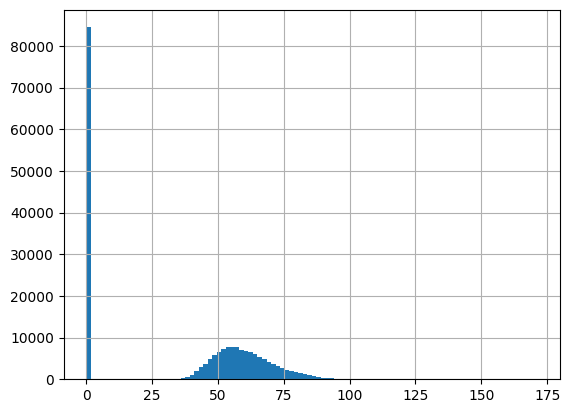

In [223]:
df['TASA_alimentacion_conc'].hist(bins=100)

In [ ]:
#revisar datos en banda 72 a 75

In [331]:
df = pd.read_csv('documentos/completos/actualizado/df_21_23_vers2.csv')

In [332]:
df['Coef_O2'] = df['O2_proporcion']/df['TASA_alimentacion_conc']

In [333]:
df

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN


<Axes: >

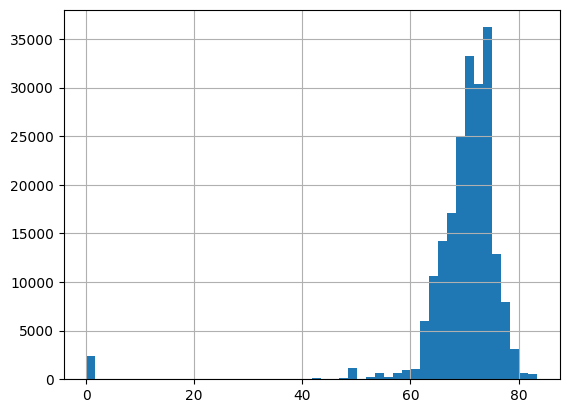

In [295]:
df['MB_Cu'].hist(bins=50)

In [322]:
df = df[df['TASA_alimentacion_conc']>10]

In [323]:
df_filtro = df[(df['MB_Cu']>65) & (df['MB_Cu']<80)]

In [324]:
df_filtro

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
7376,2021-07-26 14:45:00,359.730726,22.186288,113.178862,0.002296,0.003375,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,79.810896,1,0.705175
7377,2021-07-26 14:50:00,504.311401,35.242785,53.813225,0.002406,0.003394,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,177.733384,1,3.302783
7378,2021-07-26 14:55:00,524.144736,38.554727,69.119440,0.002319,5.669296,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,202.082572,1,2.923672
7379,2021-07-26 15:00:00,520.089897,38.450061,62.887104,0.002703,6.209809,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,199.974884,1,3.179903
7380,2021-07-26 15:05:00,544.158908,37.720190,78.031567,0.002417,4.597235,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,205.257776,1,2.630445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203764,2023-06-11 16:30:00,450.183881,42.330407,47.216157,5.500005,0.003437,1222.452710,1264.359680,11-06-2023,35.599998,25.200001,68.720001,13.800000,190.564667,1021,4.036005
203765,2023-06-11 16:35:00,455.722756,41.538631,46.876279,5.540671,0.003412,1222.450317,1264.357288,11-06-2023,35.599998,25.200001,68.720001,13.800000,189.300993,1021,4.038311
203766,2023-06-11 16:40:00,481.885285,41.644542,46.156755,5.489228,0.003514,1222.446423,1264.344666,11-06-2023,35.599998,25.200001,68.720001,13.800000,200.678921,1021,4.347769
203767,2023-06-11 16:45:00,493.353601,41.046593,45.595625,5.445810,0.003414,1222.450696,1264.342761,11-06-2023,35.599998,25.200001,68.720001,17.100000,202.504844,1021,4.441322


In [328]:
y = df_filtro.dropna()[['MB_Cu']]
#X = df_filtro.dropna()[['Flujo aire', 'Coef_O2', 'TASA_alimentacion_conc', 'alimentacion Si02', 'alimentacion carga fria']]
X = df_filtro.dropna().drop(['enriquecimiento oxigeno', 'O2_proporcion', 'TimeStamp_2', 'Timestamp','MB_Cu', 'proceso', 'conc_s'], axis=1)

In [329]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor 
  
# create a regressor object
regressor = DecisionTreeRegressor(random_state = 0, max_depth=5)
  
# fit the regressor with X and Y data
regressor.fit(X, y)

DecisionTreeRegressor(max_depth=5, random_state=0)

In [330]:
# import export_graphviz
from sklearn.tree import export_graphviz 
  
# export the decision tree to a tree.dot file
# for visualizing the plot easily anywhere
export_graphviz(regressor, out_file ='arbol_decision/actualizado/filtro_con_alim_sin_s_3.dot',
               feature_names =X.columns)

In [311]:
df_filtro[df_filtro['t ESC']<10]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso
7376,2021-07-26 14:45:00,359.730726,22.186288,113.178862,0.002296,0.003375,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,79.810896,1
7377,2021-07-26 14:50:00,504.311401,35.242785,53.813225,0.002406,0.003394,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,177.733384,1
7378,2021-07-26 14:55:00,524.144736,38.554727,69.119440,0.002319,5.669296,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,202.082572,1
7379,2021-07-26 15:00:00,520.089897,38.450061,62.887104,0.002703,6.209809,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,199.974884,1
7380,2021-07-26 15:05:00,544.158908,37.720190,78.031567,0.002417,4.597235,0.000092,0.000092,26-07-2021,29.600000,24.200001,74.309998,38.099998,205.257776,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202966,2023-06-08 22:00:00,402.360996,38.266928,42.212606,5.562291,0.003814,0.000092,0.000092,08-06-2023,34.700001,24.700001,72.180000,9.950000,153.971193,1014
202967,2023-06-08 22:05:00,388.068467,39.300887,37.257545,5.533863,0.003684,0.000092,0.000092,08-06-2023,34.700001,24.700001,72.180000,9.950000,152.514350,1014
202968,2023-06-08 22:10:00,365.487912,38.496493,39.442678,5.426669,0.003284,0.000092,0.000092,08-06-2023,34.700001,24.700001,72.180000,9.950000,140.700030,1014
202969,2023-06-08 22:15:00,401.489990,39.388965,37.558205,5.520844,0.003562,0.000092,0.000092,08-06-2023,34.700001,24.700001,72.180000,9.950000,158.142750,1014


In [240]:
df_filtro[df_filtro['MB_Cu']>73.5].describe()

,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso
count,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000,30390.000000
mean,431.878986,39.704622,62.408230,5.418120,4.291208,1112.594433,1185.774202,29.458474,24.252732,74.875438,20.427058,17130.708901,370.444357
std,36.904929,2.170114,11.015989,1.414545,3.680957,408.045827,306.561192,2.408819,1.419993,0.945258,4.309579,1530.419644,261.763755
min,0.000000,21.000000,11.065575,0.001444,0.001367,0.000092,0.000000,0.000000,0.000000,73.510002,0.000000,0.000000,1.000000
25%,404.303040,38.166146,54.879579,4.952146,0.003746,1242.025873,1251.444205,28.200001,23.600000,74.080002,18.799999,16198.577986,169.000000
50%,433.764862,39.901631,61.965209,5.480332,4.000626,1258.808338,1265.562060,28.799999,24.200001,74.709999,20.400000,17278.480360,309.000000
75%,462.194022,41.027777,69.178986,6.015659,6.905108,1274.234934,1275.715582,30.299999,25.000000,75.580002,22.400000,18230.879021,438.000000
max,642.001589,46.912858,171.149871,11.027696,19.988804,1396.617660,1394.765672,36.299999,27.200001,76.989998,44.900002,22923.321714,1013.000000


In [241]:
df_filtro[df_filtro['MB_Cu']<73.5].describe()

,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso
count,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000,47273.000000
mean,430.780928,39.222210,60.616423,5.036322,4.921537,1153.525554,1199.016679,30.155141,24.048496,71.809086,19.380885,16883.923542,455.330696
std,37.385297,2.226144,11.413903,1.307804,3.690515,345.212481,265.831877,3.324328,2.166738,0.992569,3.547179,1607.811022,300.875154
min,0.000000,20.871729,10.995115,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,70.010002,0.000000,0.000000,6.000000
25%,404.060072,37.994986,52.596403,4.499019,1.961344,1240.119226,1245.440759,28.600000,23.600000,70.989998,17.799999,15870.078194,175.000000
50%,435.555423,39.442400,59.450057,5.016421,4.982524,1255.991858,1258.258952,29.700001,24.100000,71.860001,19.500000,17049.308997,423.000000
75%,459.458691,40.427771,67.861363,5.546202,7.889206,1267.539343,1269.245581,31.600000,24.799999,72.669998,21.299999,17993.615771,658.000000
max,592.085044,46.563556,140.203421,11.981611,20.159765,1322.948623,1351.972742,37.400002,27.400000,73.489998,44.900002,21817.030888,1016.000000


In [244]:
df_filtro.drop(['Timestamp', 'TimeStamp_2'], axis=1).groupby('proceso').mean().sort_values('MB_Cu')

,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion
proceso,,,,,,,,,,,,
677,485.194194,35.883652,57.716622,4.456518,9.834522,1221.852231,1254.377094,29.200001,24.500000,70.040001,20.799999,17411.807962
565,462.469988,38.001117,54.769161,4.522823,10.018986,1254.432982,1266.030455,29.600000,24.299999,70.080002,19.600000,17573.746641
880,455.051412,38.251907,51.569688,5.508110,1.989440,1251.446580,925.892033,30.700001,22.900000,70.089996,20.400000,17403.552342
633,452.755967,37.384015,62.753886,4.150654,3.884254,1258.761997,1252.767266,28.900000,22.900000,70.153478,20.047827,16909.791641
873,441.655306,37.628827,53.758706,5.012194,0.004137,841.147593,1260.715079,32.900002,24.700001,70.190002,20.799999,16614.142536
...,...,...,...,...,...,...,...,...,...,...,...,...
46,454.899023,39.282525,67.421890,4.945299,0.002712,1252.956793,1259.806100,29.514286,26.500000,76.839996,20.600000,17851.991374
476,535.007147,24.477941,69.908927,2.305412,0.003117,0.000092,1257.953744,28.400000,23.400000,76.870003,0.000000,13176.054505
143,432.025316,40.863769,64.074550,4.931734,0.002994,0.000092,0.000092,28.400000,26.000000,76.930000,31.400000,17682.281834


In [273]:
courses = df_filtro.drop(['Timestamp', 'TimeStamp_2'], axis=1).groupby('proceso').mean().sort_values('MB_Cu').index
values = list(df_filtro.drop(['Timestamp', 'TimeStamp_2'], axis=1).groupby('proceso').mean().sort_values('MB_Cu')['ESC_FE'].values)

<BarContainer object of 675 artists>

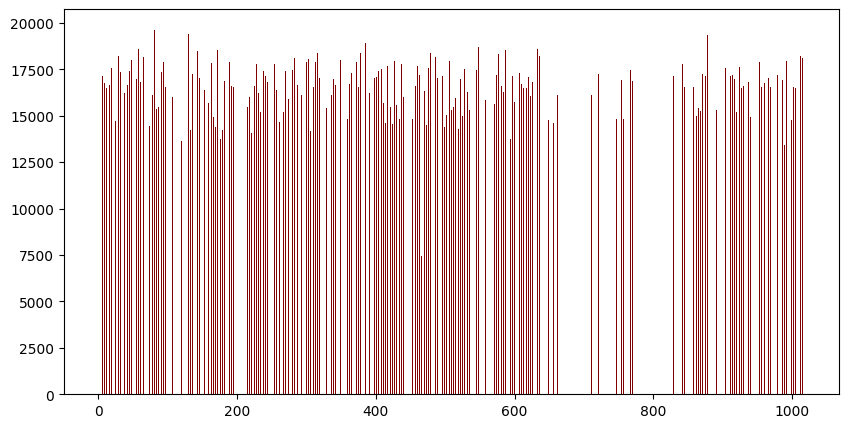

In [274]:
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(courses, values, color ='maroon',
        width = 0.4)

### arreglar df temperaturas

In [339]:
df[df['proceso'] != 0].groupby('proceso').describe()['t MB'].sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
proceso,,,,,,,,
584,37.0,0.000092,2.747893e-20,0.000092,0.000092,0.000092,0.000092,0.000092
44,38.0,0.000092,2.746890e-20,0.000092,0.000092,0.000092,0.000092,0.000092
5,38.0,0.000092,2.746890e-20,0.000092,0.000092,0.000092,0.000092,0.000092
400,39.0,0.000092,2.745938e-20,0.000092,0.000092,0.000092,0.000092,0.000092
914,38.0,0.000092,2.746890e-20,0.000092,0.000092,0.000092,0.000092,0.000092
...,...,...,...,...,...,...,...,...
481,17.0,1289.718353,5.756604e-03,1289.709009,1289.715454,1289.718127,1289.719751,1289.731201
480,17.0,1289.738741,7.056829e-03,1289.726294,1289.733374,1289.738647,1289.743481,1289.752087
479,17.0,1289.749567,8.738867e-03,1289.736780,1289.744202,1289.749280,1289.753198,1289.766943


In [354]:
maximo = df[df['proceso'] != 0].loc[:,['t MB', 'proceso']].groupby('proceso').max()

In [359]:
maximo[maximo['t MB']<1].sort_values('t MB').index

Index([  1, 740, 736, 734, 725, 724, 695, 694, 644, 627, 585, 584, 476, 437,
       424, 400, 743, 393, 744, 766, 861, 843, 834, 798, 797, 796, 795, 785,
       784, 783, 782, 781, 780, 779, 778, 760, 391, 390, 389, 139, 130,  95,
        78,  77,  76,  75,  69,  44,  23,  20,   5,   4,   3,   2, 140, 141,
       142, 143, 388, 387, 386, 385, 384, 383, 368, 914, 290, 187, 186, 183,
       168, 146, 145, 144, 253, 971],
      dtype='int64', name='proceso')

In [364]:
##lista de temperaturas 0  total 76
t_cero = maximo[maximo['t MB']<1].sort_values('t MB').index.to_list().copy()

In [365]:
t_cero

[1,
 740,
 736,
 734,
 725,
 724,
 695,
 694,
 644,
 627,
 585,
 584,
 476,
 437,
 424,
 400,
 743,
 393,
 744,
 766,
 861,
 843,
 834,
 798,
 797,
 796,
 795,
 785,
 784,
 783,
 782,
 781,
 780,
 779,
 778,
 760,
 391,
 390,
 389,
 139,
 130,
 95,
 78,
 77,
 76,
 75,
 69,
 44,
 23,
 20,
 5,
 4,
 3,
 2,
 140,
 141,
 142,
 143,
 388,
 387,
 386,
 385,
 384,
 383,
 368,
 914,
 290,
 187,
 186,
 183,
 168,
 146,
 145,
 144,
 253,
 971]

In [371]:
df_1 = df.copy()

In [372]:
del df

In [374]:
for i in t_cero:
    df_1.drop(df_1[df_1['proceso'] == i].index, inplace = True)

In [379]:
df_1[df_1['proceso'] != 0]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
7994,2021-07-28 18:15:00,371.309871,21.771041,110.245868,7.245961,0.568903,0.000092,1243.232703,28-07-2021,29.200001,24.000000,73.510002,21.4,80.838026,6,0.733252
7995,2021-07-28 18:20:00,413.509970,35.626260,53.736096,7.790750,0.003421,0.000092,1243.223584,28-07-2021,29.200001,24.000000,73.510002,21.4,147.318139,6,2.741512
7996,2021-07-28 18:25:00,390.576794,41.293776,48.049149,7.081996,0.003731,0.000092,1243.228699,28-07-2021,29.200001,24.000000,73.510002,21.4,161.283907,6,3.356644
7997,2021-07-28 18:30:00,382.310699,41.199336,51.150066,7.011893,0.003203,0.000092,1243.217065,28-07-2021,29.200001,24.000000,73.510002,21.4,157.509471,6,3.079360
7998,2021-07-28 18:35:00,378.814679,41.134194,52.480452,6.959583,0.003436,0.000092,1243.212170,28-07-2021,29.200001,24.000000,73.510002,21.4,155.822363,6,2.969151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203764,2023-06-11 16:30:00,450.183881,42.330407,47.216157,5.500005,0.003437,1222.452710,1264.359680,11-06-2023,35.599998,25.200001,68.720001,13.8,190.564667,1021,4.036005
203765,2023-06-11 16:35:00,455.722756,41.538631,46.876279,5.540671,0.003412,1222.450317,1264.357288,11-06-2023,35.599998,25.200001,68.720001,13.8,189.300993,1021,4.038311
203766,2023-06-11 16:40:00,481.885285,41.644542,46.156755,5.489228,0.003514,1222.446423,1264.344666,11-06-2023,35.599998,25.200001,68.720001,13.8,200.678921,1021,4.347769
203767,2023-06-11 16:45:00,493.353601,41.046593,45.595625,5.445810,0.003414,1222.450696,1264.342761,11-06-2023,35.599998,25.200001,68.720001,17.1,202.504844,1021,4.441322


In [380]:
df_1['proceso'].unique()

array([   0,    6,    7,    8,    9,   10,   11,   12,   13,   14,   15,
         16,   17,   18,   19,   21,   22,   24,   25,   26,   27,   28,
         29,   30,   31,   32,   33,   34,   35,   36,   37,   38,   39,
         40,   41,   42,   43,   45,   46,   47,   48,   49,   50,   51,
         52,   53,   54,   55,   56,   57,   58,   59,   60,   61,   62,
         63,   64,   65,   66,   67,   68,   70,   71,   72,   73,   74,
         79,   80,   81,   82,   83,   84,   85,   86,   87,   88,   89,
         90,   91,   92,   93,   94,   96,   97,   98,   99,  100,  101,
        102,  103,  104,  105,  106,  107,  108,  109,  110,  111,  112,
        113,  114,  115,  116,  117,  118,  119,  120,  121,  122,  123,
        124,  125,  126,  127,  128,  129,  131,  132,  133,  134,  135,
        136,  137,  138,  147,  148,  149,  150,  151,  152,  153,  154,
        155,  156,  157,  158,  159,  160,  161,  162,  163,  164,  165,
        166,  167,  169,  170,  171,  172,  173,  1

<Axes: >

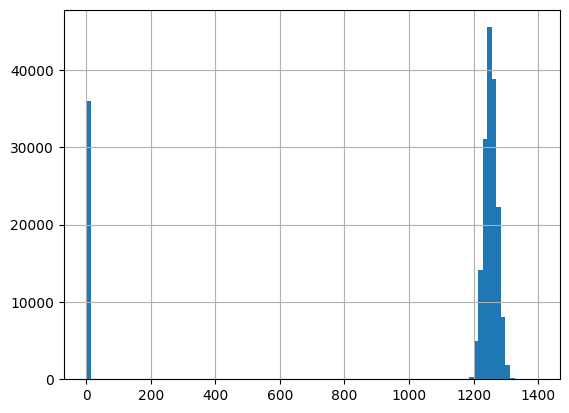

In [383]:
df_1['t MB'].hist(bins=100)

In [388]:
df_1.loc[df_1[(df_1['proceso']!=0) & (df_1['t MB']<1)].index, 't MB'] = np.nan

In [390]:
df_1.loc[df_1[(df_1['proceso']!=0) & (df_1['t MB']<1)].index, :]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2


In [392]:
df_1['t MB'] = df_1['t MB'].fillna(method='backfill')

<Axes: >

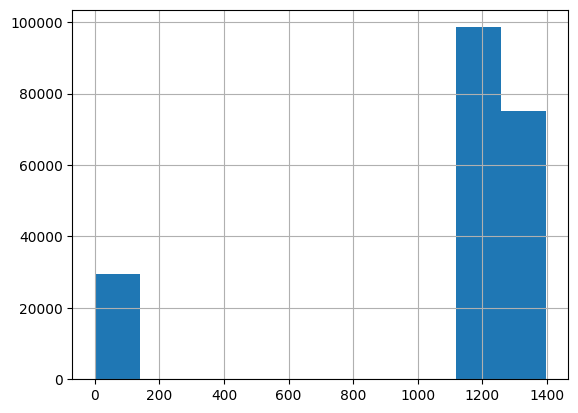

In [394]:
df_1['t MB'].hist()

In [393]:
df_1[df_1['t MB'].isnull()]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2


In [401]:
df_1

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN


In [398]:
maximo = df_1[df_1['proceso'] != 0].loc[:,['t ESC', 'proceso']].groupby('proceso').max()

In [400]:
maximo[maximo['t ESC']<1]

,t ESC
proceso,
31,0.000092
165,0.000092
542,0.000092
606,0.000092
645,0.000092
647,0.000092
696,0.000092
697,0.000092
698,0.000092


In [395]:
df_1[df_1['proceso'] != 0].groupby('proceso').describe()['t ESC'].sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
proceso,,,,,,,,
31,28.0,0.000092,2.760244e-20,0.000092,0.000092,0.000092,0.000092,0.000092
645,30.0,0.000092,2.756842e-20,0.000092,0.000092,0.000092,0.000092,0.000092
697,30.0,0.000092,2.756842e-20,0.000092,0.000092,0.000092,0.000092,0.000092
741,29.0,0.000092,2.758483e-20,0.000092,0.000092,0.000092,0.000092,0.000092
935,37.0,0.000092,2.747893e-20,0.000092,0.000092,0.000092,0.000092,0.000092
...,...,...,...,...,...,...,...,...
194,37.0,1298.941373,1.898453e+01,1201.536184,1290.562842,1304.177295,1304.194775,1325.626917
270,12.0,1306.300647,6.753430e-03,1306.290210,1306.295028,1306.302527,1306.305136,1306.310559
365,9.0,1306.789879,1.503877e-02,1306.765015,1306.782056,1306.794641,1306.796155,1306.810999


In [403]:
t_cero_esc = maximo[maximo['t ESC']<1].sort_values('t ESC').index.to_list().copy()

In [407]:
len(t_cero_esc)

28

In [ ]:
#28 procesos eliminados

In [405]:
for i in t_cero_esc:
    df_1.drop(df_1[df_1['proceso'] == i].index, inplace = True)

In [406]:
df_1['proceso'].unique()

array([   0,    6,    7,    8,    9,   10,   11,   12,   13,   14,   15,
         16,   17,   18,   19,   21,   22,   24,   25,   26,   27,   28,
         29,   30,   32,   33,   34,   35,   36,   37,   38,   39,   40,
         41,   42,   43,   45,   46,   47,   48,   49,   50,   51,   52,
         53,   54,   55,   56,   57,   58,   59,   60,   61,   62,   63,
         64,   65,   66,   67,   68,   70,   71,   72,   73,   74,   79,
         80,   81,   82,   83,   84,   85,   86,   87,   88,   89,   90,
         91,   92,   93,   94,   96,   97,   98,   99,  100,  101,  102,
        103,  104,  105,  106,  107,  108,  109,  110,  111,  112,  113,
        114,  115,  116,  117,  118,  119,  120,  121,  122,  123,  124,
        125,  126,  127,  128,  129,  131,  132,  133,  134,  135,  136,
        137,  138,  147,  148,  149,  150,  151,  152,  153,  154,  155,
        156,  157,  158,  159,  160,  161,  162,  163,  164,  166,  167,
        169,  170,  171,  172,  173,  174,  175,  1

In [408]:
df_1

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN


In [410]:
df_1.loc[df_1[(df_1['proceso']!=0) & (df_1['t ESC']<1)].index, 't ESC'] = np.nan

In [411]:
df_1[df_1['t ESC'].isnull()]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
8299,2021-07-29 19:40:00,422.634117,30.078978,80.211879,6.587930,0.003360,1250.957532,NaN,29-07-2021,29.100000,23.900000,71.470001,3.30,127.124024,8,1.584853
8300,2021-07-29 19:45:00,466.484840,38.397824,52.483334,3.885833,0.003789,1250.955701,NaN,29-07-2021,29.100000,23.900000,71.470001,3.30,179.120029,8,3.412893
8301,2021-07-29 19:50:00,449.084175,39.218123,51.942948,3.070314,0.003564,1250.940857,NaN,29-07-2021,29.100000,23.900000,71.470001,3.30,176.122382,8,3.390689
8302,2021-07-29 19:55:00,439.515927,39.045476,52.592470,3.009257,0.002835,1250.957996,NaN,29-07-2021,29.100000,23.900000,71.470001,3.30,171.611088,8,3.263035
8303,2021-07-29 20:00:00,407.267068,39.231004,51.035845,2.996035,0.003159,1250.945020,NaN,29-07-2021,29.100000,23.900000,71.470001,3.30,159.774960,8,3.130642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202966,2023-06-08 22:00:00,402.360996,38.266928,42.212606,5.562291,0.003814,1286.892542,NaN,08-06-2023,34.700001,24.700001,72.180000,9.95,153.971193,1014,3.647517
202967,2023-06-08 22:05:00,388.068467,39.300887,37.257545,5.533863,0.003684,1286.892542,NaN,08-06-2023,34.700001,24.700001,72.180000,9.95,152.514350,1014,4.093516
202968,2023-06-08 22:10:00,365.487912,38.496493,39.442678,5.426669,0.003284,1286.892542,NaN,08-06-2023,34.700001,24.700001,72.180000,9.95,140.700030,1014,3.567203
202969,2023-06-08 22:15:00,401.489990,39.388965,37.558205,5.520844,0.003562,1286.892542,NaN,08-06-2023,34.700001,24.700001,72.180000,9.95,158.142750,1014,4.210605


In [412]:
df_1['t ESC'] = df_1['t ESC'].fillna(method='backfill')

In [414]:
df_1[df_1['t ESC'].isnull()]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2


In [415]:
df_1

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,0.0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000,0.0,0,NaN


In [416]:
206327-202660

3667

In [417]:
df_1.to_csv('documentos/completos/actualizado/df_21_23_filtro_t.csv')

## arbol con data filtrada

In [445]:
df_arbol_2023 = pd.read_csv('documentos/completos/actualizado/df_21_23_filtro_t.csv')

In [446]:
df_arbol_2023.drop('Unnamed: 0', axis=1, inplace=True)

In [447]:
df_arbol_2023 = df_arbol_2023[df_arbol_2023['proceso']!=0]

In [448]:
df = df_arbol_2023

In [449]:
df.shape

(118180, 16)

In [450]:
df

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2
7846,2021-07-28 18:15:00,371.309871,21.771041,110.245868,7.245961,0.568903,1250.850317,1243.232703,28-07-2021,29.200001,24.000000,73.510002,21.4,80.838026,6,0.733252
7847,2021-07-28 18:20:00,413.509970,35.626260,53.736096,7.790750,0.003421,1250.850317,1243.223584,28-07-2021,29.200001,24.000000,73.510002,21.4,147.318139,6,2.741512
7848,2021-07-28 18:25:00,390.576794,41.293776,48.049149,7.081996,0.003731,1250.850317,1243.228699,28-07-2021,29.200001,24.000000,73.510002,21.4,161.283907,6,3.356644
7849,2021-07-28 18:30:00,382.310699,41.199336,51.150066,7.011893,0.003203,1250.850317,1243.217065,28-07-2021,29.200001,24.000000,73.510002,21.4,157.509471,6,3.079360
7850,2021-07-28 18:35:00,378.814679,41.134194,52.480452,6.959583,0.003436,1250.850317,1243.212170,28-07-2021,29.200001,24.000000,73.510002,21.4,155.822363,6,2.969151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200097,2023-06-11 16:30:00,450.183881,42.330407,47.216157,5.500005,0.003437,1222.452710,1264.359680,11-06-2023,35.599998,25.200001,68.720001,13.8,190.564667,1021,4.036005
200098,2023-06-11 16:35:00,455.722756,41.538631,46.876279,5.540671,0.003412,1222.450317,1264.357288,11-06-2023,35.599998,25.200001,68.720001,13.8,189.300993,1021,4.038311
200099,2023-06-11 16:40:00,481.885285,41.644542,46.156755,5.489228,0.003514,1222.446423,1264.344666,11-06-2023,35.599998,25.200001,68.720001,13.8,200.678921,1021,4.347769
200100,2023-06-11 16:45:00,493.353601,41.046593,45.595625,5.445810,0.003414,1222.450696,1264.342761,11-06-2023,35.599998,25.200001,68.720001,17.1,202.504844,1021,4.441322


<Axes: >

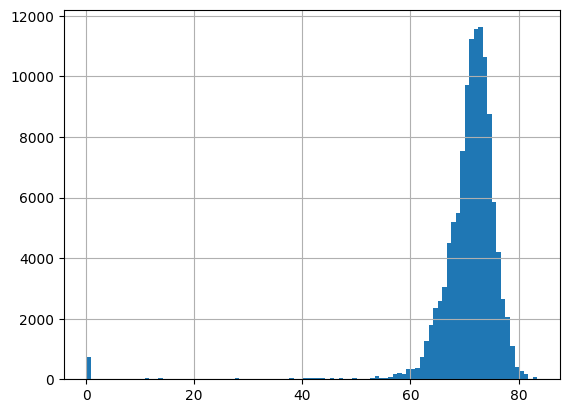

In [451]:
df['MB_Cu'].hist(bins=100)

In [452]:
df[(df['MB_Cu']>65) & (df['MB_Cu']<80)].shape

(108306, 16)

In [453]:
df_filtro = df[(df['MB_Cu']>65) & (df['MB_Cu']<80)]

In [454]:
df_filtro.columns

Index(['Timestamp', 'Flujo aire', 'enriquecimiento oxigeno',
       'TASA_alimentacion_conc', 'alimentacion Si02',
       'alimentacion carga fria', 't MB', 't ESC', 'TimeStamp_2', 'conc_s',
       'conc_cu', 'MB_Cu', 'ESC_FE', 'O2_proporcion', 'proceso', 'Coef_O2'],
      dtype='object')

In [455]:
y = df_filtro.dropna()[['MB_Cu', 'ESC_FE']]
X = df_filtro.dropna()[['Flujo aire', 'Coef_O2', 'TASA_alimentacion_conc', 'alimentacion Si02', 'alimentacion carga fria']]
#X = df_filtro.dropna().drop(['enriquecimiento oxigeno', 'O2_proporcion', 'TimeStamp_2', 'Timestamp','MB_Cu', 'proceso', 'conc_s'], axis=1)

In [456]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor 
  
# create a regressor object
regressor = DecisionTreeRegressor(random_state = 0, max_depth=5)
  
# fit the regressor with X and Y data
regressor.fit(X, y)

DecisionTreeRegressor(max_depth=5, random_state=0)

In [457]:
# import export_graphviz
from sklearn.tree import export_graphviz 
# export the decision tree to a tree.dot file
# for visualizing the plot easily anywhere
export_graphviz(regressor, out_file ='arbol_decision/actualizado_filtro/solo_entradas_2_salidas.dot',
               feature_names =X.columns)

In [ ]:
#http://www.webgraphviz.com/   pagina para visualizar archivo creado .dot

### Arbol con ESC con delay(prueba)

In [ ]:
## delay escoria FE_304

In [ ]:
df_2021 = pd.read_excel('documentos/Fe3O4_2021.xlsx')
df_2022 = pd.read_excel('documentos/Leyes 2021-2022..xlsx', skiprows=0, sheet_name = 'Ley Fe3O4_Escoria')
df_2023 = pd.read_excel('documentos/2023/Leyes.xlsx', skiprows=1, sheet_name = 'Ley Fe3O4_Escoria')

df_2021.drop('Ensaye', axis=1, inplace=True)
df_2022.drop('Ensaye', axis=1, inplace=True)
df_2023.drop(['Unnamed: 0', 'Equipo', 'Producto'], axis=1, inplace=True)

In [ ]:
df_21_23 = pd.concat([df_2021,df_2022], axis=0)
df_21_23 = pd.concat([df_21_23,df_2023], axis=0)
df_21_23.dropna(inplace=True)

In [ ]:
df_21_23['ESC_FE'] = df_21_23['Valor'].shift(periods=1) #desfasar valores ley FE_304

In [ ]:
for fechas in df_21_23['Fecha'].unique():
    fecha = str(fechas)
    indice = df_21_23[df_21_23['Fecha'] == fecha].index[0]
    df_21_23.loc[indice, 'ESC_FE'] = np.nan

In [ ]:
df_21_23.loc[df_21_23[~df_21_23.duplicated(subset='Fecha', keep = False)].index, 'ESC_FE'] = df_21_23.loc[df_21_23[~df_21_23.duplicated(subset='Fecha', keep = False)].index, 'Valor']

In [ ]:
df_21_23['ESC_FE'] = df_21_23['ESC_FE'].fillna(method='backfill')

In [ ]:
df_1 = pd.read_csv('documentos/completos/actualizado/df_21_23_filtro_t.csv')

In [ ]:
df_21_23['Timestamp'] = df_21_23['Fecha'].astype(str)+' '+df_21_23['Hora'].astype(str)
df_21_23['Timestamp'] = pd.to_datetime(df_21_23['Timestamp'])
df_21_23.drop(['Fecha', 'Hora'], axis=1, inplace=True)
df_21_23.rename(columns={'ESC_FE':'ESC_FE_delay'}, inplace=True)
df_1['Timestamp'] = pd.to_datetime(df_1['Timestamp'])
df_merge= pd.merge(df_1,df_21_23, how='left', on = 'Timestamp')

indice = df_merge[df_merge['proceso'] == 0].index
df_merge.loc[indice, 'ESC_FE_delay'] = 0
df_merge['ESC_FE_delay'] = df_merge['ESC_FE_delay'].fillna(method='backfill')
df_merge['ESC_FE_delay'] = df_merge['ESC_FE_delay'].fillna(method='ffill')
df_merge.drop(['Unnamed: 0', 'Valor'], axis=1, inplace=True)

df_merge.to_csv('documentos/completos/actualizado/df_21_23_esc_delay.csv')

In [500]:
df_2023 = pd.read_csv('documentos/completos/actualizado/df_21_23_esc_delay.csv')

In [501]:
df_2023.shape

(202660, 18)

Text(0, 0.5, 'Frecuencia')

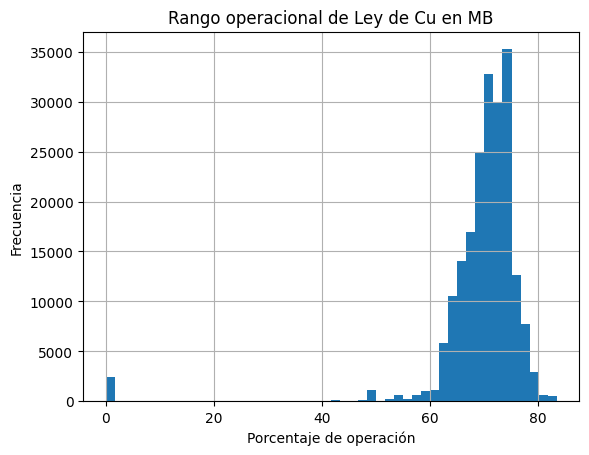

In [502]:
df_2023['MB_Cu'].hist(bins=50)
pyplot.title("Rango operacional de Ley de Cu en MB")
pyplot.xlabel("Porcentaje de operación")
pyplot.ylabel("Frecuencia")

In [509]:
df_2023.drop('Unnamed: 0', axis=1, inplace=True)

In [510]:
df_2023 = df_2023[df_2023['proceso']!=0]

In [491]:
df = df_2023

In [492]:
df_filtro = df[(df['MB_Cu']>65) & (df['MB_Cu']<80)]

In [493]:
df_filtro.head()

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2,ESC_FE_delay
7846,2021-07-28 18:15:00,371.309871,21.771041,110.245868,7.245961,0.568903,1250.850317,1243.232703,28-07-2021,29.200001,24.0,73.510002,21.4,80.838026,6,0.733252,18.200001
7847,2021-07-28 18:20:00,413.509970,35.626260,53.736096,7.790750,0.003421,1250.850317,1243.223584,28-07-2021,29.200001,24.0,73.510002,21.4,147.318139,6,2.741512,18.200001
7848,2021-07-28 18:25:00,390.576794,41.293776,48.049149,7.081996,0.003731,1250.850317,1243.228699,28-07-2021,29.200001,24.0,73.510002,21.4,161.283907,6,3.356644,18.200001
7849,2021-07-28 18:30:00,382.310699,41.199336,51.150066,7.011893,0.003203,1250.850317,1243.217065,28-07-2021,29.200001,24.0,73.510002,21.4,157.509471,6,3.079360,18.200001
7850,2021-07-28 18:35:00,378.814679,41.134194,52.480452,6.959583,0.003436,1250.850317,1243.212170,28-07-2021,29.200001,24.0,73.510002,21.4,155.822363,6,2.969151,18.200001


In [484]:
y = df_filtro.dropna()[['MB_Cu']]
X = df_filtro.dropna()[['Flujo aire', 'Coef_O2', 'TASA_alimentacion_conc', 'alimentacion Si02', 'alimentacion carga fria',
                        't MB', 't ESC', 'conc_cu', 'conc_s']]
#X = df_filtro.dropna().drop(['enriquecimiento oxigeno', 'O2_proporcion', 'TimeStamp_2', 'Timestamp','MB_Cu', 'proceso', 'conc_s'], axis=1)

In [485]:
# import the regressor
from sklearn.tree import DecisionTreeRegressor 
  
# create a regressor object
regressor = DecisionTreeRegressor(random_state = 0, max_depth=5)
  
# fit the regressor with X and Y data
regressor.fit(X, y)

DecisionTreeRegressor(max_depth=5, random_state=0)

In [486]:
# import export_graphviz
from sklearn.tree import export_graphviz 
# export the decision tree to a tree.dot file
# for visualizing the plot easily anywhere
export_graphviz(regressor, out_file ='arbol_decision/actualizado_filtro/solo_entradas_2.dot',
               feature_names =X.columns)

In [471]:
df_filtro.shape

(108306, 17)

In [479]:
212532-3232

209300

In [480]:
209300-202660

6640

In [497]:
from matplotlib import pyplot

Text(0, 0.5, 'Frecuencia')

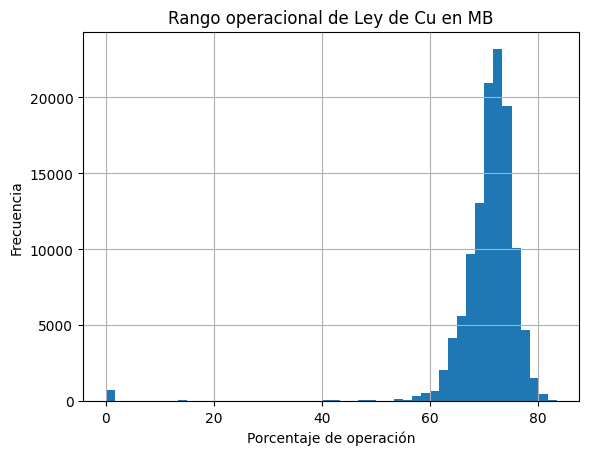

In [499]:
df['MB_Cu'].hist(bins=50)
pyplot.title("Rango operacional de Ley de Cu en MB")
pyplot.xlabel("Porcentaje de operación")
pyplot.ylabel("Frecuencia")

<Axes: >

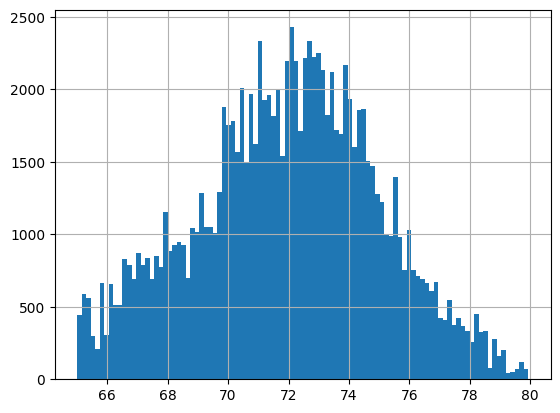

In [495]:
df_filtro['MB_Cu'].hist(bins=100)
pyplot.title("Rango operacional de Ley de Cu en MB")
pyplot.xlabel("Porcentaje de operación")
pyplot.ylabel("Frecuencia")

In [519]:
df_2023.shape

(118180, 17)

Text(0, 0.5, 'Frecuencia')

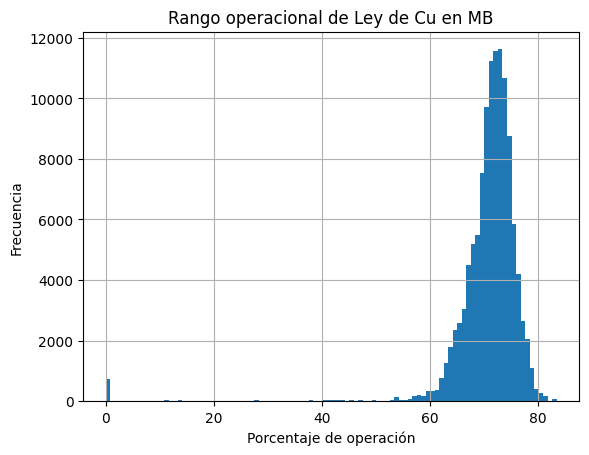

In [515]:
df_2023['MB_Cu'].hist(bins=100)
pyplot.title("Rango operacional de Ley de Cu en MB")
pyplot.xlabel("Porcentaje de operación")
pyplot.ylabel("Frecuencia")

<Axes: >

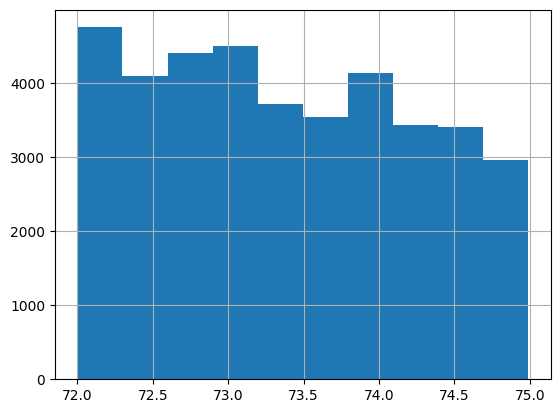

In [512]:
df_2023[(df_2023['MB_Cu']>=72) & (df_2023['MB_Cu']<=75)]['MB_Cu'].hist()

In [514]:
df_2023[((df_2023['MB_Cu']>=72) & (df_2023['MB_Cu']<=75))]

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,O2_proporcion,proceso,Coef_O2,ESC_FE_delay
7846,2021-07-28 18:15:00,371.309871,21.771041,110.245868,7.245961,0.568903,1250.850317,1243.232703,28-07-2021,29.200001,24.0,73.510002,21.4,80.838026,6,0.733252,18.200001
7847,2021-07-28 18:20:00,413.509970,35.626260,53.736096,7.790750,0.003421,1250.850317,1243.223584,28-07-2021,29.200001,24.0,73.510002,21.4,147.318139,6,2.741512,18.200001
7848,2021-07-28 18:25:00,390.576794,41.293776,48.049149,7.081996,0.003731,1250.850317,1243.228699,28-07-2021,29.200001,24.0,73.510002,21.4,161.283907,6,3.356644,18.200001
7849,2021-07-28 18:30:00,382.310699,41.199336,51.150066,7.011893,0.003203,1250.850317,1243.217065,28-07-2021,29.200001,24.0,73.510002,21.4,157.509471,6,3.079360,18.200001
7850,2021-07-28 18:35:00,378.814679,41.134194,52.480452,6.959583,0.003436,1250.850317,1243.212170,28-07-2021,29.200001,24.0,73.510002,21.4,155.822363,6,2.969151,18.200001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199542,2023-06-09 18:15:00,382.052993,39.763429,30.516201,5.173211,0.002725,1246.634583,1236.521985,09-06-2023,34.299999,24.4,72.750000,15.1,151.917372,1015,4.978253,0.000000
199543,2023-06-09 18:20:00,379.506637,38.711285,31.026727,5.323282,0.004276,1246.634155,1236.506653,09-06-2023,34.299999,24.4,72.750000,15.1,146.911894,1015,4.735011,0.000000
199544,2023-06-09 18:25:00,400.881696,26.027317,30.538521,4.721228,0.002923,1246.629175,1236.491998,09-06-2023,34.299999,24.4,72.750000,15.1,104.338751,1015,3.416628,0.000000
199554,2023-06-09 19:15:00,431.662610,27.836409,90.484034,4.001878,0.002815,1246.592029,1236.425500,09-06-2023,34.299999,24.4,72.750000,15.1,120.159369,1016,1.327962,0.000000


In [ ]:
79203 fuera 38977 dentro

In [518]:
118180

118180

In [521]:
(38977/118180)*100

32.98104586224404

In [ ]:
202660

In [ ]:
60088

<Axes: >

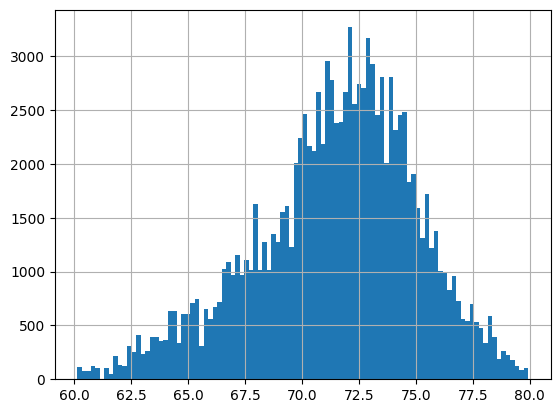

In [517]:
df_2023[(df_2023['MB_Cu']>=60) & (df_2023['MB_Cu']<=80)]['MB_Cu'].hist(bins=100)

In [529]:
df_2023.groupby('proceso')['MB_Cu'].mean()

proceso
6       66.666457
7       71.470001
8       69.143454
9       68.874792
10      69.576000
          ...    
1017    69.769997
1018    69.769997
1019    69.769997
1020    68.084001
1021    68.720001
Name: MB_Cu, Length: 917, dtype: float64

In [528]:
df_2023.groupby('proceso')['MB_Cu'].mean()[~((df_2023.groupby('proceso')['MB_Cu'].mean() >=72) & (df_2023.groupby('proceso')['MB_Cu'].mean() <=75))]

proceso
6       66.666457
7       71.470001
8       69.143454
9       68.874792
10      69.576000
          ...    
1017    69.769997
1018    69.769997
1019    69.769997
1020    68.084001
1021    68.720001
Name: MB_Cu, Length: 685, dtype: float64

In [530]:
232/917

0.2529989094874591

In [ ]:
685

In [ ]:
232

## nuevos datos ago-sep

In [64]:
df_ago_sep = pd.read_excel("documentos/2023/ago-sep/CT.xlsx", skiprows=1, sheet_name = 'Average.')

In [65]:
df_ago_sep

,TimeStamp,.FI_325,.[FFIC_324.PV],.TASA_INST,.[WIC_135.PV],.[WIC_134.PV],.TIR_311,.TIR_313
0,45142.003461,0.000000,21.000000,0.000000,0.002332,0.003099,1195.315234,1210.556958
1,45142.006933,0.000000,21.000000,0.000000,0.002333,0.003001,1195.305042,1210.556396
2,45142.010405,0.000000,21.000000,0.000000,0.002321,0.002957,1195.313318,1210.553137
3,45142.013877,0.000000,21.000000,0.000000,0.002330,0.002974,1195.318530,1210.554077
4,45142.017350,0.000000,21.000000,0.000000,0.002328,0.003082,1195.304749,1210.550513
...,...,...,...,...,...,...,...,...
11214,45180.982627,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348
11215,45180.986100,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881
11216,45180.989572,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726
11217,45180.993044,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144


In [8]:
Cobre = pd.read_excel("documentos/2023/ago-sep/Cobre y azufre..xlsx", skiprows=1, sheet_name = 'Cu alimentación.')
Azufre = pd.read_excel("documentos/2023/ago-sep/Cobre y azufre..xlsx", skiprows=1, sheet_name = 'S alimentación.')

In [12]:
Azufre.drop(['Unnamed: 0', 'Nombre', 'Unidad'],axis=1, inplace = True)

In [15]:
Azufre.rename(columns={'Día':'Ley_S'}, inplace=True)

In [17]:
Cobre.drop(['Unnamed: 0', 'Nombre', 'Unidad'],axis=1, inplace = True)
Cobre.rename(columns={'Día':'Ley_Cu'}, inplace=True)

In [20]:
Cobre['Fecha'] = pd.to_datetime(Cobre['Fecha'], unit='D', origin='1899-12-30')
Azufre['Fecha'] = pd.to_datetime(Azufre['Fecha'], unit='D', origin='1899-12-30')

In [38]:
Cobre.rename(columns={'Fecha':'TimeStamp'}, inplace=True)
Azufre.rename(columns={'Fecha':'TimeStamp'}, inplace=True)

In [46]:
Cobre.rename(columns={'TimeStamp':'TimeStamp_2'}, inplace=True)
Azufre.rename(columns={'TimeStamp':'TimeStamp_2'}, inplace=True)

In [66]:
df_ago_sep['TimeStamp'] = pd.to_datetime(df_ago_sep['TimeStamp'], unit='D', origin='1899-12-30')

In [26]:
df_ago_sep['TimeStamp'] = df_ago_sep['TimeStamp'].dt.strftime("%Y-%m-%d %H:%M:%S")

In [34]:
df_ago_sep['TimeStamp'] = pd.to_datetime(df_ago_sep['TimeStamp'])

In [35]:
df_ago_sep['TimeStamp'] = df_ago_sep['TimeStamp'] + timedelta(seconds=1)

In [67]:
df_ago_sep

,TimeStamp,.FI_325,.[FFIC_324.PV],.TASA_INST,.[WIC_135.PV],.[WIC_134.PV],.TIR_311,.TIR_313
0,2023-08-04 00:04:59.000000000,0.000000,21.000000,0.000000,0.002332,0.003099,1195.315234,1210.556958
1,2023-08-04 00:09:58.999999744,0.000000,21.000000,0.000000,0.002333,0.003001,1195.305042,1210.556396
2,2023-08-04 00:14:59.000000256,0.000000,21.000000,0.000000,0.002321,0.002957,1195.313318,1210.553137
3,2023-08-04 00:19:59.000000000,0.000000,21.000000,0.000000,0.002330,0.002974,1195.318530,1210.554077
4,2023-08-04 00:24:59.000000256,0.000000,21.000000,0.000000,0.002328,0.003082,1195.304749,1210.550513
...,...,...,...,...,...,...,...,...
11214,2023-09-11 23:34:59.000000000,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348
11215,2023-09-11 23:39:59.000000256,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881
11216,2023-09-11 23:44:59.000000000,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726
11217,2023-09-11 23:49:58.999999744,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144


In [43]:
df_ago_sep['TimeStamp_2'] = df_ago_sep['TimeStamp'].dt.strftime("%Y-%m-%d")

In [45]:
df_ago_sep['TimeStamp_2'] = pd.to_datetime(df_ago_sep['TimeStamp_2'])

In [48]:
merge = pd.merge(df_ago_sep,Cobre, how='left', on = 'TimeStamp_2')

In [49]:
merge = pd.merge(merge,Azufre, how='left', on = 'TimeStamp_2')

In [50]:
merge

,TimeStamp,.FI_325,.[FFIC_324.PV],.TASA_INST,.[WIC_135.PV],.[WIC_134.PV],.TIR_311,.TIR_313,TimeStamp_2,Ley_Cu,Ley_S
0,2023-08-04 00:05:00,0.000000,21.000000,0.000000,0.002332,0.003099,1195.315234,1210.556958,2023-08-04,23.799999,34.000000
1,2023-08-04 00:09:59,0.000000,21.000000,0.000000,0.002333,0.003001,1195.305042,1210.556396,2023-08-04,23.799999,34.000000
2,2023-08-04 00:15:00,0.000000,21.000000,0.000000,0.002321,0.002957,1195.313318,1210.553137,2023-08-04,23.799999,34.000000
3,2023-08-04 00:20:00,0.000000,21.000000,0.000000,0.002330,0.002974,1195.318530,1210.554077,2023-08-04,23.799999,34.000000
4,2023-08-04 00:25:00,0.000000,21.000000,0.000000,0.002328,0.003082,1195.304749,1210.550513,2023-08-04,23.799999,34.000000
...,...,...,...,...,...,...,...,...,...,...,...
11214,2023-09-11 23:35:00,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348,2023-09-11,25.100000,33.400002
11215,2023-09-11 23:40:00,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881,2023-09-11,25.100000,33.400002
11216,2023-09-11 23:45:00,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726,2023-09-11,25.100000,33.400002
11217,2023-09-11 23:49:59,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144,2023-09-11,25.100000,33.400002


In [53]:
merge.rename(columns={'TimeStamp':'Timestamp', '.FI_325':'Flujo aire', '.[FFIC_324.PV]':'enriquecimiento oxigeno',
                      '.TASA_INST':'TASA_alimentacion_conc', '.[WIC_135.PV]':'alimentacion Si02',
                      '.[WIC_134.PV]':'alimentacion carga fria', '.TIR_311':'t MB', '.TIR_313':'t ESC',
                     'Ley_Cu':'MB_Cu', 'Ley_S':'ESC_FE'}, inplace=True)

In [61]:
merge.sort_values(by = 'Timestamp', ascending=True)

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,MB_Cu,ESC_FE
0,2023-08-04 00:05:00,0.000000,21.000000,0.000000,0.002332,0.003099,1195.315234,1210.556958,2023-08-04,23.799999,34.000000
1,2023-08-04 00:09:59,0.000000,21.000000,0.000000,0.002333,0.003001,1195.305042,1210.556396,2023-08-04,23.799999,34.000000
2,2023-08-04 00:15:00,0.000000,21.000000,0.000000,0.002321,0.002957,1195.313318,1210.553137,2023-08-04,23.799999,34.000000
3,2023-08-04 00:20:00,0.000000,21.000000,0.000000,0.002330,0.002974,1195.318530,1210.554077,2023-08-04,23.799999,34.000000
4,2023-08-04 00:25:00,0.000000,21.000000,0.000000,0.002328,0.003082,1195.304749,1210.550513,2023-08-04,23.799999,34.000000
...,...,...,...,...,...,...,...,...,...,...,...
11214,2023-09-11 23:35:00,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348,2023-09-11,25.100000,33.400002
11215,2023-09-11 23:40:00,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881,2023-09-11,25.100000,33.400002
11216,2023-09-11 23:45:00,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726,2023-09-11,25.100000,33.400002
11217,2023-09-11 23:49:59,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144,2023-09-11,25.100000,33.400002


In [51]:
df_21_23 = pd.read_csv("documentos/completos/actualizado/df_21_23.csv")

In [55]:
df_21_23.drop('Unnamed: 0', axis=1, inplace=True)

In [56]:
df_21_23

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE
0,2021-07-01 00:05:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
1,2021-07-01 00:10:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
2,2021-07-01 00:15:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
3,2021-07-01 00:20:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
4,2021-07-01 00:25:00,0.0,21.0,0.0,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
...,...,...,...,...,...,...,...,...,...,...,...,...,...
206322,2023-06-20 13:40:00,0.0,21.0,0.0,0.002237,0.003333,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206323,2023-06-20 13:45:00,0.0,21.0,0.0,0.002224,0.003468,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206324,2023-06-20 13:50:00,0.0,21.0,0.0,0.002239,0.003187,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000
206325,2023-06-20 13:55:00,0.0,21.0,0.0,0.002208,0.003252,0.000092,0.000092,20-06-2023,0.0,0.0,68.720001,17.100000


In [68]:
Concatenar = pd.concat([df_21_23, merge])

In [69]:
Concatenar

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE
0,2021-07-01 00:05:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
1,2021-07-01 00:10:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
2,2021-07-01 00:15:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
3,2021-07-01 00:20:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
4,2021-07-01 00:25:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11214,2023-09-11 23:35:00,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002
11215,2023-09-11 23:40:00,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002
11216,2023-09-11 23:45:00,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002
11217,2023-09-11 23:49:59,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002


In [74]:
Concatenar.info()

<class 'pandas.core.frame.DataFrame'>
Index: 217546 entries, 0 to 11218
Data columns (total 13 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   Timestamp                217546 non-null  datetime64[ns]
 1   Flujo aire               217546 non-null  float64       
 2   enriquecimiento oxigeno  217546 non-null  float64       
 3   TASA_alimentacion_conc   217546 non-null  float64       
 4   alimentacion Si02        217546 non-null  float64       
 5   alimentacion carga fria  217546 non-null  float64       
 6   t MB                     217546 non-null  float64       
 7   t ESC                    217546 non-null  float64       
 8   TimeStamp_2              217546 non-null  object        
 9   conc_s                   206327 non-null  float64       
 10  conc_cu                  206327 non-null  float64       
 11  MB_Cu                    217546 non-null  float64       
 12  ESC_FE                

In [73]:
Concatenar['Timestamp'] = pd.to_datetime(Concatenar['Timestamp'])

In [82]:
Concatenar.reset_index(drop=True, inplace=True)

In [75]:
Concatenar['segundos'] = Concatenar['Timestamp'].dt.strftime("%S")

In [83]:
Concatenar[Concatenar['segundos'] == '59'].index

Index([206328, 206333, 206335, 206337, 206342, 206344, 206346, 206351, 206353,
       206355,
       ...
       217517, 217519, 217521, 217526, 217528, 217530, 217535, 217537, 217539,
       217544],
      dtype='int64', length=3738)

In [87]:
Concatenar.loc[Concatenar[Concatenar['segundos'] == '59'].index, 'Timestamp'] = Concatenar.loc[Concatenar[Concatenar['segundos'] == '59'].index, 'Timestamp'] + timedelta(seconds=1)

In [88]:
Concatenar

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,TimeStamp_2,conc_s,conc_cu,MB_Cu,ESC_FE,segundos
0,2021-07-01 00:05:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,00
1,2021-07-01 00:10:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,00
2,2021-07-01 00:15:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,00
3,2021-07-01 00:20:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,00
4,2021-07-01 00:25:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,01-07-2021,0.0,0.0,74.309998,38.099998,00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217541,2023-09-11 23:35:00,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002,00
217542,2023-09-11 23:40:00,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002,00
217543,2023-09-11 23:45:00,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002,00
217544,2023-09-11 23:50:00,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144,2023-09-11 00:00:00,NaN,NaN,25.100000,33.400002,59


In [91]:
Concatenar.drop('segundos',axis=1, inplace=True)

In [93]:
Concatenar.to_csv('documentos/completos/actualizado/df_21_actual.csv', index=False)

## filtrar todo

In [84]:
#df_todo = pd.read_csv('documentos/completos/actualizado/df_21_actual.csv')
#df_todo = pd.read_csv('documentos/completos/actualizado/df_con_turnos.csv')
df_todo = pd.read_csv('documentos/completos/actualizado/df_o2.csv')

C:\Users\kvalenci\AppData\Local\Temp\ipykernel_26384\808141861.py:3: DtypeWarning: Columns (13,14,15,16,17,18) have mixed types. Specify dtype option on import or set low_memory=False.
  df_todo = pd.read_csv('documentos/completos/actualizado/df_o2.csv')


In [85]:
df_todo

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,conc_s,conc_cu,MB_Cu,ESC_FE,Coef_o2,Operador TC,Jefe turno TC,Operador TA,Jefe turno TA,Operador TB,Jefe turno TB
0,2021-07-01 00:05:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,0.0,0.0,74.309998,38.099998,50.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-07-01 00:10:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,0.0,0.0,74.309998,38.099998,50.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-07-01 00:15:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,0.0,0.0,74.309998,38.099998,50.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2021-07-01 00:20:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,0.0,0.0,74.309998,38.099998,50.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-07-01 00:25:00,0.000000,21.000000,0.000000,0.000000,0.000000,0.000092,0.000092,0.0,0.0,74.309998,38.099998,50.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217555,2023-09-11 23:35:00,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN
217556,2023-09-11 23:40:00,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN
217557,2023-09-11 23:45:00,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN
217558,2023-09-11 23:50:00,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

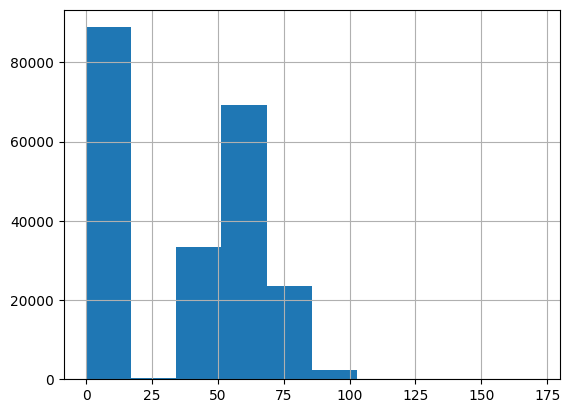

In [86]:
df_todo['TASA_alimentacion_conc'].hist()

In [87]:
df_todo[df_todo['TASA_alimentacion_conc'] > 10].index

Index([  7376,   7377,   7378,   7379,   7380,   7381,   7382,   7383,   7384,
         7385,
       ...
       217550, 217551, 217552, 217553, 217554, 217555, 217556, 217557, 217558,
       217559],
      dtype='int64', length=128718)

In [88]:
df_todo.drop(df_todo[df_todo['TASA_alimentacion_conc'] < 10].index, inplace=True)

In [89]:
df_todo.shape

(128718, 19)

<Axes: >

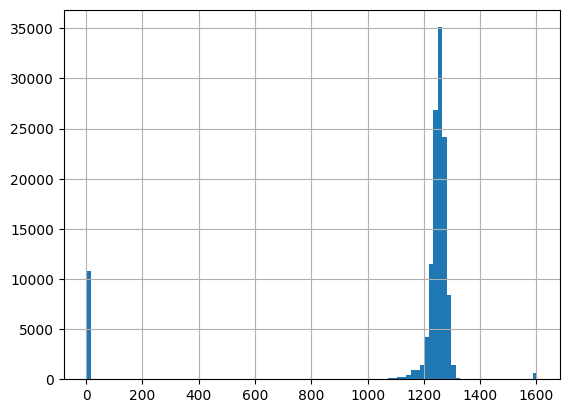

In [90]:
df_todo['t MB'].hist(bins=100)

In [91]:
df_todo[(df_todo['t MB'] > 1200) & (df_todo['t MB'] < 1400)].index

Index([  8022,   8023,   8024,   8025,   8026,   8027,   8028,   8029,   8030,
         8031,
       ...
       217549, 217550, 217552, 217553, 217554, 217555, 217556, 217557, 217558,
       217559],
      dtype='int64', length=112182)

In [92]:
df_todo.drop(df_todo[df_todo['t MB'] < 1200].index, inplace=True)

In [93]:
df_todo.drop(df_todo[df_todo['t MB'] > 1350].index, inplace=True)

In [94]:
df_todo

,Timestamp,Flujo aire,enriquecimiento oxigeno,TASA_alimentacion_conc,alimentacion Si02,alimentacion carga fria,t MB,t ESC,conc_s,conc_cu,MB_Cu,ESC_FE,Coef_o2,Operador TC,Jefe turno TC,Operador TA,Jefe turno TA,Operador TB,Jefe turno TB
8022,2021-07-28 20:35:00,386.765862,42.087224,55.717095,0.002499,2.997979,1250.850317,1248.814722,29.200001,24.0,68.970001,19.500000,176.331432,Oscar Bacho Gordillo,NaN,Ivan Olmos Reinuaba,NaN,Gilberto Tapia Torres,NaN
8023,2021-07-28 20:40:00,384.060898,42.018498,56.907531,0.002164,2.927657,1250.861694,1248.819312,29.200001,24.0,68.970001,19.500000,178.158211,Oscar Bacho Gordillo,NaN,Ivan Olmos Reinuaba,NaN,Gilberto Tapia Torres,NaN
8024,2021-07-28 20:45:00,388.132261,41.977908,56.832309,0.002163,3.029617,1250.872559,1248.823767,29.200001,24.0,54.430000,19.500000,176.699738,Oscar Bacho Gordillo,NaN,Ivan Olmos Reinuaba,NaN,Gilberto Tapia Torres,NaN
8025,2021-07-28 20:50:00,395.903771,41.935628,59.888076,0.002108,2.557245,1250.873071,1248.820166,29.200001,24.0,54.430000,19.500000,168.572108,Oscar Bacho Gordillo,NaN,Ivan Olmos Reinuaba,NaN,Gilberto Tapia Torres,NaN
8026,2021-07-28 20:55:00,397.406214,41.974565,58.179856,0.002323,0.003145,1250.878528,1248.814978,29.200001,24.0,54.430000,19.500000,171.242048,Oscar Bacho Gordillo,NaN,Ivan Olmos Reinuaba,NaN,Gilberto Tapia Torres,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217555,2023-09-11 23:35:00,393.317924,40.677585,53.871237,0.096021,0.003450,1258.431433,1258.231348,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN
217556,2023-09-11 23:40:00,404.494920,40.248867,50.666109,3.738308,8.868536,1258.442102,1258.240881,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN
217557,2023-09-11 23:45:00,411.871650,40.778573,52.518757,3.970107,9.671481,1258.419519,1258.243726,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN
217558,2023-09-11 23:50:00,412.788987,40.518438,48.804970,3.988134,9.239018,1258.435083,1258.235144,NaN,NaN,25.100000,33.400002,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

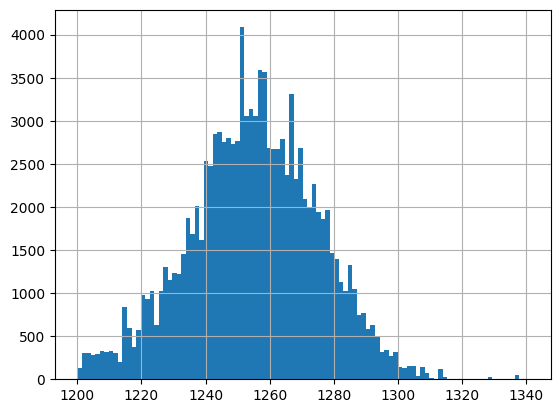

In [103]:
df_todo['t MB'].hist(bins=100)

<Axes: >

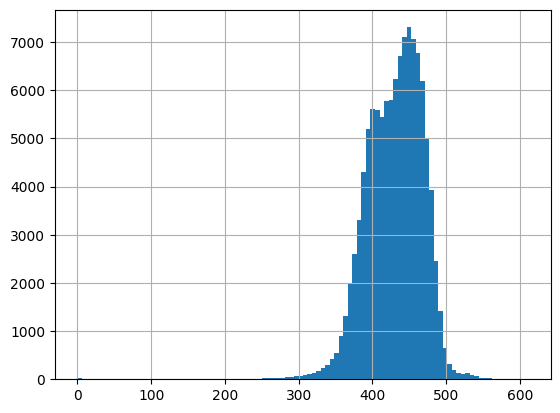

In [96]:
df_todo['Flujo aire'].hist(bins=100)

In [97]:
df_todo.reset_index(drop=True, inplace=True)

In [100]:
df_todo.to_csv('documentos/completos/actualizado/df_filtrada.csv', index=False)

<Axes: >

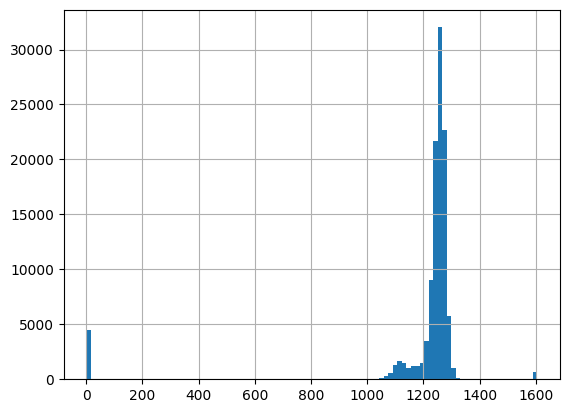

In [102]:
df_todo['t ESC'].hist(bins=100)

In [38]:
df_todo.drop(df_todo[df_todo['t ESC'] < 1200].index, inplace=True)

In [39]:
df_todo.drop(df_todo[df_todo['t ESC'] > 1350].index, inplace=True)

<Axes: >

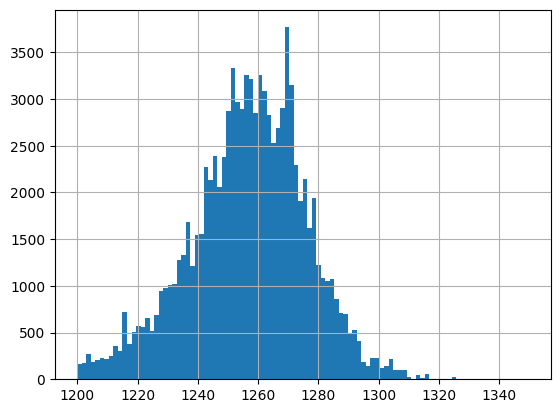

In [40]:
df_todo['t ESC'].hist(bins=100)

In [41]:
df_todo.shape

(96108, 13)

In [104]:
df_todo.columns

Index(['Timestamp', 'Flujo aire', 'enriquecimiento oxigeno',
       'TASA_alimentacion_conc', 'alimentacion Si02',
       'alimentacion carga fria', 't MB', 't ESC', 'conc_s', 'conc_cu',
       'MB_Cu', 'ESC_FE', 'Coef_o2', 'Operador TC', 'Jefe turno TC',
       'Operador TA', 'Jefe turno TA', 'Operador TB', 'Jefe turno TB'],
      dtype='object')

In [114]:
df_todo[(df_todo['t MB'] < 1214) & (df_todo['t MB'] > 1200) & (df_todo['conc_s'] > 25.5) & (df_todo['conc_s'] < 28.85)]['MB_Cu'].describe()

count    540.000000
mean      70.956907
std        4.511240
min       59.810001
25%       69.879997
50%       70.884998
75%       73.169998
max       80.930000
Name: MB_Cu, dtype: float64

<Axes: >

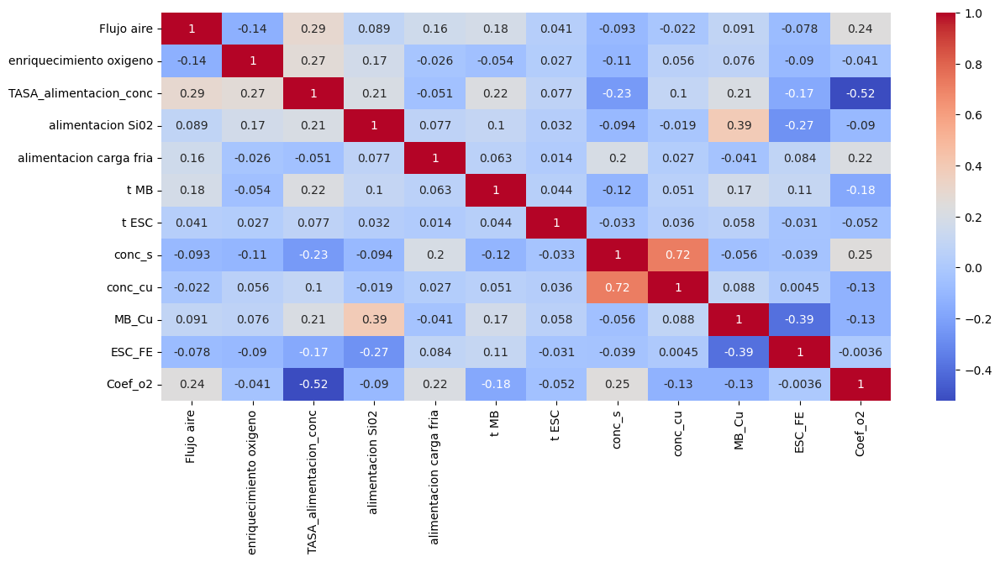

In [106]:
plt.figure(figsize=(14,6))
sns.heatmap(df_todo.drop(['Timestamp', 'Operador TC', 'Jefe turno TC',
       'Operador TA', 'Jefe turno TA', 'Operador TB', 'Jefe turno TB'], axis=1).corr(),cmap='coolwarm',annot=True)

C:\Users\kvalenci\AppData\Local\anaconda3\envs\SAM\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


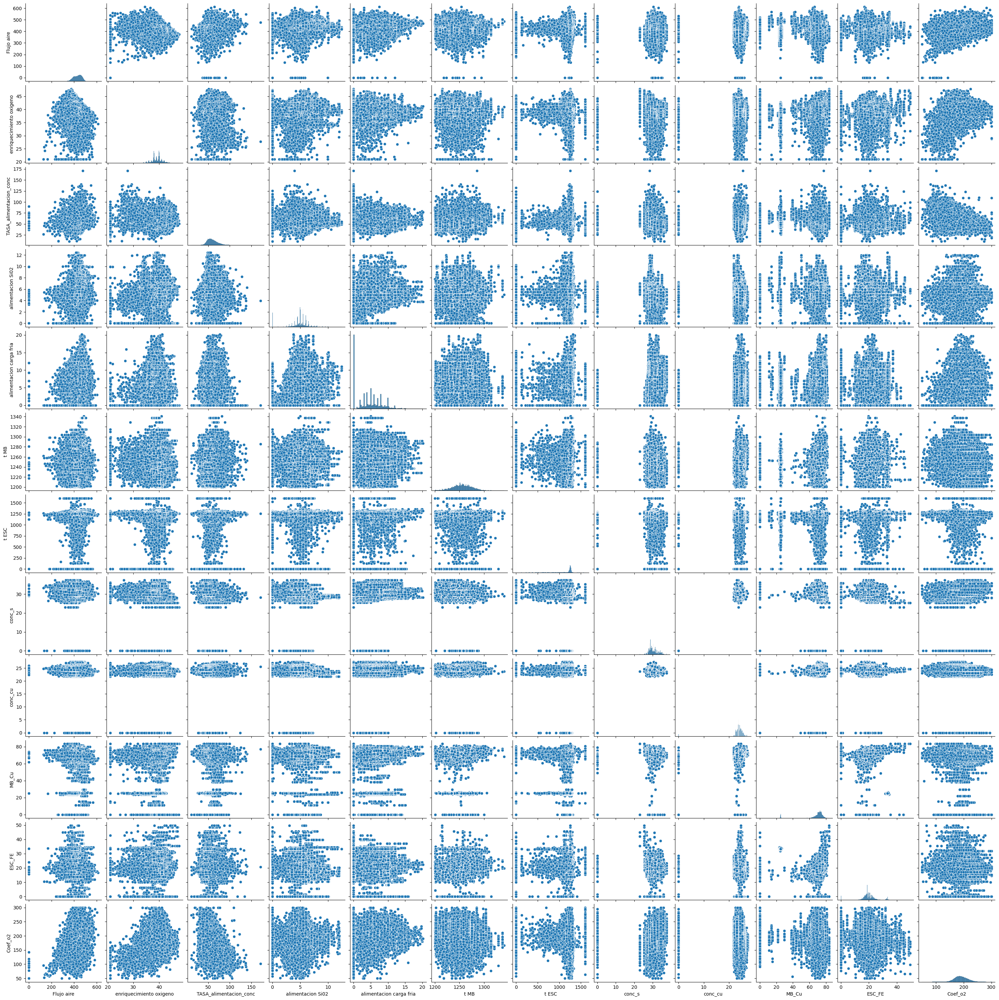

In [108]:
sns.pairplot(df_todo.drop(['Timestamp', 'Operador TC', 'Jefe turno TC',
       'Operador TA', 'Jefe turno TA', 'Operador TB', 'Jefe turno TB'], axis=1))